# M148 Fall 2024 Final Project 
Team: Ashley Le, Chelsea Lai, Ginny Ghang, Hannah Kendall, and Rubelina Riley
*You can find our main documentation and the entire project on our GitHub repository: https://github.com/hannahkendall04/M148_Project*

**The following notebook contains the consolidated code for our final project. The code is divided into the below sections. Each section is designed to be able to run independently of the others, thus enabling customized exploration and analysis of the data.**
1. Data Preprocessing, Cleaning and Exploratory Data Analysis (EDA)
2. Linear Regression
3. Logistic Regression
4. Classification
5. Principal Component Analysis (PCA)
6. Clustering
7. Neural Networks


In [1]:
# Import Libraries 
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression, LogisticRegression, Ridge, Lasso
from sklego.linear_model import LADRegression
from sklearn.model_selection import cross_val_score, cross_validate, train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA


pd.set_option('display.max_columns', None)
pd.options.display.max_colwidth = 500
pd.options.display.max_rows = 100

# 1. Data Preprocessing, Cleaning, and Exploratory Data Analysis

In [2]:
# Import data
spotify_data_orig = pd.read_csv('Data/spotify_dataset.csv')

# Print out column name: 
spotify_data_orig.columns

Index(['Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name',
       'popularity', 'duration_ms', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'track_genre'],
      dtype='object')

Valid ranges for each predictor variable:
* popularity: 0 - 100
* duration_ms: >0 
* danceability: 0 - 1
* energy: 0 - 1 
* key: 0 - 11 
* loudness: -49.53 - 4.53 
* mode: 0 or 1
* speechiness: 0 - 1
* acousticness: 0 - 1 
* instrumentalness: 0 - 1
* liveness: 0 - 1
* valence: 0 - 1 
* tempo: 0 - 243 
* time_signature: 3 - 7

In [3]:
# Remove duplicates and missing values
spotify_nona = spotify_data_orig.dropna()
spotify_data_unique = spotify_nona.drop_duplicates("track_id", keep="first").drop(columns=["Unnamed: 0"])

# Check unique IDs
nrows = spotify_data_unique.shape[0]
nunique = spotify_data_unique['track_id'].nunique()

assert nrows == nunique, "There are duplicate track IDs"

# Check summaries of each row
spotify_data_unique.select_dtypes('number').describe()

,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,89740.000000,8.974000e+04,89740.000000,89740.000000,89740.000000,89740.000000,89740.000000,89740.000000,89740.000000,89740.000000,89740.000000,89740.000000,89740.000000,89740.000000
mean,33.198808,2.291444e+05,0.562166,0.634458,5.283530,-8.498994,0.636973,0.087442,0.328285,0.173415,0.216971,0.469474,122.058134,3.897426
std,20.580640,1.129458e+05,0.176692,0.256606,3.559912,5.221518,0.480875,0.113278,0.338321,0.323849,0.194885,0.262864,30.117651,0.453437
min,0.000000,8.586000e+03,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,19.000000,1.730400e+05,0.450000,0.457000,2.000000,-10.322250,0.000000,0.036000,0.017100,0.000000,0.098200,0.249000,99.262750,4.000000
50%,33.000000,2.132955e+05,0.576000,0.676000,5.000000,-7.185000,1.000000,0.048900,0.188000,0.000058,0.132000,0.457000,122.013000,4.000000
75%,49.000000,2.642930e+05,0.692000,0.853000,8.000000,-5.108000,1.000000,0.085900,0.625000,0.097625,0.279000,0.682000,140.077000,4.000000
max,100.000000,5.237295e+06,0.985000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000,243.372000,5.000000


In [4]:
# 1136 rows (~1%) with invalid time signatures.
# Removing these rows will not significantly impact the size of our data, so we remove
rows_invalid_time_sig = spotify_data_unique[spotify_data_unique['time_signature'] < 3]
pct_invalid_time_sig = len(rows_invalid_time_sig)/len(spotify_data_unique.index)
valid_spotify_data = spotify_data_unique[spotify_data_unique['time_signature'] >= 3]
print ("Percent of invalid time signature: " + str(pct_invalid_time_sig))

spotify_data_cleaned = spotify_data_unique[spotify_data_unique['time_signature'] >= 3]

# Save cleaned data to a new file for easy future access
with pd.ExcelWriter('Data/clean_data.xlsx') as writer:
    spotify_data_cleaned.to_excel(writer, sheet_name='Clean', index=False)

Percent of invalid time signature: 0.011232449297971918


c:\Users\hbken\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\hbken\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\hbken\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\hbken\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

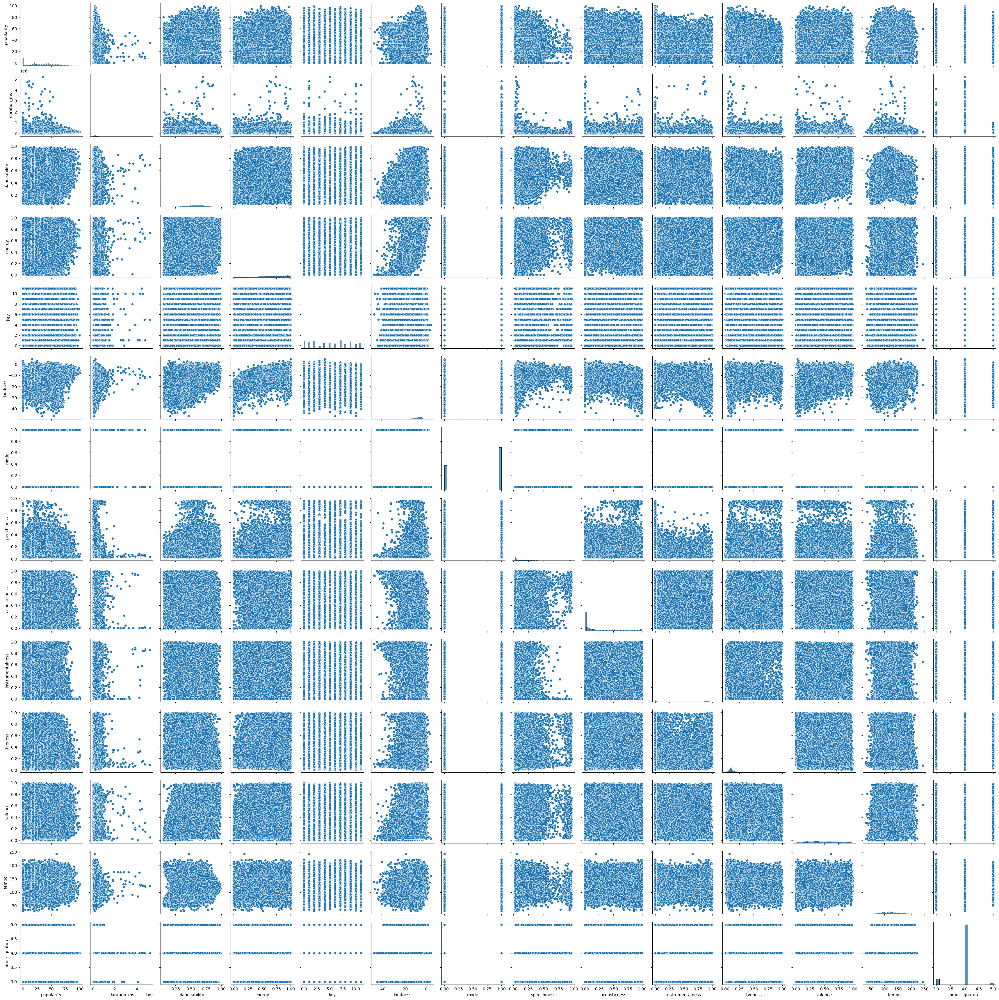

In [5]:
# Visualize scatterplot across all dependent variables
spotify_data_cleaned_dependent = spotify_data_cleaned.drop(columns = ["track_id", "artists","track_name", "track_genre", "explicit"])
sns.pairplot(data=spotify_data_cleaned_dependent)
plt.show()

In [6]:
# Select only numeric columns
spotify_data_cleaned_numeric = spotify_data_cleaned_dependent.select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix
Correlation_Matrix = spotify_data_cleaned_numeric.corr()

# Display the correlation matrix
print(Correlation_Matrix)

                  popularity  duration_ms  danceability    energy       key  \
popularity          1.000000    -0.024766      0.063853  0.012642  0.002463   
duration_ms        -0.024766     1.000000     -0.070639  0.062452  0.011082   
danceability        0.063853    -0.070639      1.000000  0.129525  0.034687   
energy              0.012642     0.062452      0.129525  1.000000  0.045983   
key                 0.002463     0.011082      0.034687  0.045983  1.000000   
loudness            0.073175    -0.005840      0.254835  0.759726  0.035812   
mode               -0.016403    -0.040011     -0.063504 -0.074680 -0.142105   
speechiness        -0.045647    -0.060111      0.107686  0.140145  0.018360   
acousticness       -0.036838    -0.108605     -0.172064 -0.733844 -0.044916   
instrumentalness   -0.128763     0.123329     -0.182924 -0.175411 -0.003492   
liveness           -0.013301     0.011639     -0.127366  0.194528 -0.003012   
valence            -0.012574    -0.152863      0.484

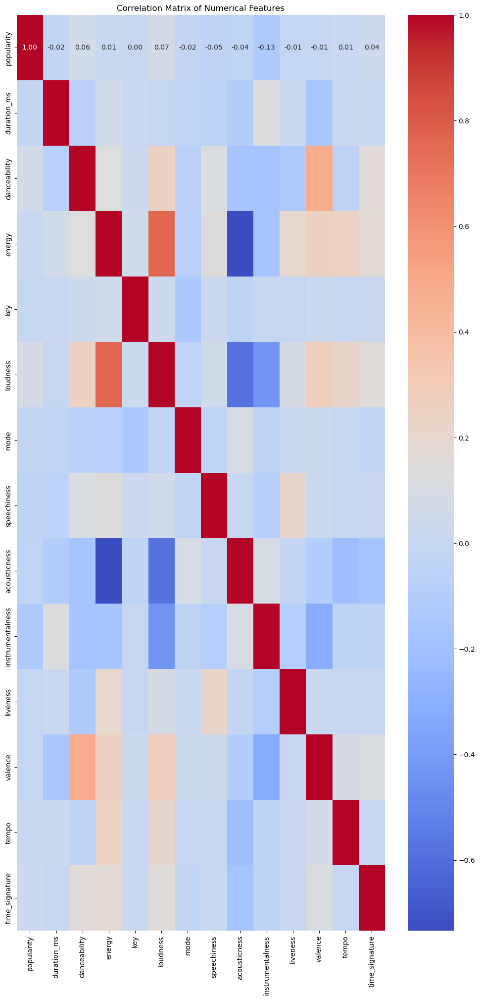

loudness            1.000000
energy              0.759726
valence             0.279826
danceability        0.254835
tempo               0.213648
time_signature      0.148100
liveness            0.084208
popularity          0.073175
speechiness         0.055219
key                 0.035812
duration_ms        -0.005840
mode               -0.037504
instrumentalness   -0.430668
acousticness       -0.582554
Name: loudness, dtype: float64
loudness            1.000000
energy              0.759726
valence             0.279826
danceability        0.254835
tempo               0.213648
time_signature      0.148100
liveness            0.084208
popularity          0.073175
speechiness         0.055219
key                 0.035812
duration_ms        -0.005840
mode               -0.037504
instrumentalness   -0.430668
acousticness       -0.582554
Name: loudness, dtype: float64


In [7]:
plt.figure(figsize=(12, 24))
sns.heatmap(Correlation_Matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of Numerical Features')
plt.show()

# Check specific correlations with 'popularity'
corr_with_popularity = Correlation_Matrix['loudness'].sort_values(ascending=False)

print(corr_with_popularity)
print(Correlation_Matrix['loudness'].sort_values(ascending=False))

# 2. Linear Regression

In [8]:
spotify_cleaned = pd.read_excel('Data/clean_data.xlsx')

# Check csv for proper loading
spotify_cleaned.columns

Index(['track_id', 'artists', 'album_name', 'track_name', 'popularity',
       'duration_ms', 'explicit', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'track_genre'],
      dtype='object')

In [9]:
# Print correlations between numeric columns -> only print those that have correlations above 0.2
correlations = spotify_cleaned.corr(numeric_only=True)
correlations[correlations.abs() > 0.2].replace(1, np.nan).dropna(how='all', axis=1).dropna(how='all', axis=0)

,explicit,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
explicit,NaN,NaN,NaN,NaN,0.325346,NaN,NaN,NaN,NaN,NaN
danceability,NaN,NaN,NaN,0.254835,NaN,NaN,NaN,NaN,0.484892,NaN
energy,NaN,NaN,NaN,0.759726,NaN,-0.733844,NaN,NaN,0.249962,0.247234
loudness,NaN,0.254835,0.759726,NaN,NaN,-0.582554,-0.430668,NaN,0.279826,0.213648
speechiness,0.325346,NaN,NaN,NaN,NaN,NaN,NaN,0.220905,NaN,NaN
acousticness,NaN,NaN,-0.733844,-0.582554,NaN,NaN,NaN,NaN,NaN,-0.217672
instrumentalness,NaN,NaN,NaN,-0.430668,NaN,NaN,NaN,NaN,-0.325794,NaN
liveness,NaN,NaN,NaN,NaN,0.220905,NaN,NaN,NaN,NaN,NaN
valence,NaN,0.484892,0.249962,0.279826,NaN,NaN,-0.325794,NaN,NaN,NaN
tempo,NaN,NaN,0.247234,0.213648,NaN,-0.217672,NaN,NaN,NaN,NaN


We chose loudness as our response variable because the correlation matrix shows that it has the highest correlation with the highest number of other variables. We did not use a function to select oit predictor variables for this check in

In [10]:
# Split data into testing, validation, and training sets
# 60% training, 20% validation, 20% testing

training_data, validation_data = train_test_split(spotify_cleaned, test_size=0.2, random_state=42, stratify=spotify_cleaned["track_genre"])

In [11]:
# Fit a LAD regression model to the training data using the following variables: instrumentalness, speechiness, energy, valence, danceability, acousticness
# We chose these variables because they have the highest correlation with loudness, our response variable

vars = ["instrumentalness", "energy", "valence", "danceability", "acousticness"]
response = "loudness"
lad_fit = LADRegression()
lad_fit.fit(training_data[vars], y=training_data[response])

LADRegression()

In [12]:
# Fit an LS regression model to the training data using the following variables: instrumentalness, speechiness, energy, valence, danceability, acousticness
ls_fit = LinearRegression()
ls_fit.fit(X=training_data[vars], y=training_data[response])

LinearRegression()

In [13]:
# Find the residuals between the true values and the predicted values for the training and validation sets

pred_train_df = pd.DataFrame({'true': training_data[response], 'ls_pred': ls_fit.predict(training_data[vars]), 'lad_pred': lad_fit.predict(training_data[vars])})

pred_val_df = pd.DataFrame({'true': validation_data[response], 'ls_pred': ls_fit.predict(validation_data[vars]), 'lad_pred': lad_fit.predict(validation_data[vars])})

In [14]:
# calculate the rMSE, MAE, MAD, correlation, and R2 of the true price with the LS and LAD predictions
print('Training LS rMSE:', np.sqrt(mean_squared_error(pred_train_df['true'], pred_train_df['ls_pred'])))
print('Training LS MAE:', mean_absolute_error(pred_train_df['true'], pred_train_df['ls_pred']))
print('Training LS MAD:', np.median(np.abs(pred_train_df['true'] - pred_train_df['ls_pred'])))
print('Training LS correlation:', np.corrcoef(pred_train_df['true'], pred_train_df['ls_pred'])[0, 1])
print('Training LS R2:', r2_score(pred_train_df['true'], pred_train_df['ls_pred']))

print('Training LAD rMSE:', np.sqrt(mean_squared_error(pred_train_df['true'], pred_train_df['lad_pred'])))
print('Training LAD MAE:', mean_absolute_error(pred_train_df['true'], pred_train_df['lad_pred']))
print('Training LAD MAD:', np.median(np.abs(pred_train_df['true'] - pred_train_df['lad_pred'])))
print('Training LAD correlation:', np.corrcoef(pred_train_df['true'], pred_train_df['lad_pred'])[0, 1])
print('Training LAD R2:', r2_score(pred_train_df['true'], pred_train_df['lad_pred']))

Training LS rMSE: 2.88287928456931
Training LS MAE: 2.0549479376626016
Training LS MAD: 1.5399259768824631
Training LS correlation: 0.8264353921168537
Training LS R2: 0.6829954573433377
Training LAD rMSE: 2.9458157370419236
Training LAD MAE: 2.0156735065450624
Training LAD MAD: 1.4564071200831776
Training LAD correlation: 0.8254507595859994
Training LAD R2: 0.6690032522496187


In [15]:
# calculate the rMSE, MAE, MAD, correlation, and R2 of the true price with the LS and LAD predictions
print('Training LS rMSE:', np.sqrt(mean_squared_error(pred_val_df['true'], pred_val_df['ls_pred'])))
print('Training LS MAE:', mean_absolute_error(pred_val_df['true'], pred_val_df['ls_pred']))
print('Training LS MAD:', np.median(np.abs(pred_val_df['true'] - pred_val_df['ls_pred'])))
print('Training LS correlation:', np.corrcoef(pred_val_df['true'], pred_val_df['ls_pred'])[0, 1])
print('Training LS R2:', r2_score(pred_val_df['true'], pred_val_df['ls_pred']))

print('Training LAD rMSE:', np.sqrt(mean_squared_error(pred_val_df['true'], pred_val_df['lad_pred'])))
print('Training LAD MAE:', mean_absolute_error(pred_val_df['true'], pred_val_df['lad_pred']))
print('Training LAD MAD:', np.median(np.abs(pred_val_df['true'] - pred_val_df['lad_pred'])))
print('Training LAD correlation:', np.corrcoef(pred_val_df['true'], pred_val_df['lad_pred'])[0, 1])
print('Training LAD R2:', r2_score(pred_val_df['true'], pred_val_df['lad_pred']))

Training LS rMSE: 2.8818619071927674
Training LS MAE: 2.0602627664991973
Training LS MAD: 1.5468390429180534
Training LS correlation: 0.8294203730929426
Training LS R2: 0.6879169262870377
Training LAD rMSE: 2.948020864128953
Training LAD MAE: 2.0210342499146075
Training LAD MAD: 1.4663504075323424
Training LAD correlation: 0.8284651910986447
Training LAD R2: 0.6734234570459581


Based on the above values, the LS model is better than the LAD model for predicting loudness based on our manually selected predictor variables since the rMSE is lower, and the R^2 value is higher. This occurs in both the training and validation data set. Since the R^2 values for both the training and validation data sets are very similar, it is unlikely that the model is overfitting. However, since the R^2 values are relatively low, it is likely that the model is not a good fit for the data, and is thus underfitting.

In [16]:
X = training_data.drop(columns=['loudness'])[vars]
# scale the predictors
X_std = (X - X.mean()) / X.std()
y = training_data['loudness']

In [17]:
alphas = np.logspace(-1, 6, 100)
ridge_cv_scores = []
# create a for loop to compute the cross-validation score for each alpha value
for alpha in alphas:
    ridge = Ridge(alpha=alpha)
    ridge_cv = cross_validate(estimator=ridge,
                              X=X_std,
                              y=y,
                              cv=10,
                              scoring='neg_root_mean_squared_error')
    ridge_cv_scores.append({'alpha': alpha,
                            'log_alpha': np.log(alpha),
                            'test_mse': -np.mean(ridge_cv['test_score'])})

# convert the cross-validation scores into a data frame
ridge_cv_scores_df = pd.DataFrame(ridge_cv_scores)

In [18]:
ridge_cv_scores_df

,alpha,log_alpha,test_mse
0,0.100000,-2.302585,2.883080
1,0.117681,-2.139776,2.883080
2,0.138489,-1.976967,2.883080
3,0.162975,-1.814158,2.883080
4,0.191791,-1.651349,2.883080
5,0.225702,-1.488540,2.883080
6,0.265609,-1.325731,2.883080
7,0.312572,-1.162922,2.883080
8,0.367838,-1.000113,2.883080
9,0.432876,-0.837304,2.883080


In [19]:
# define the alpha values to test
alphas = np.logspace(-1, 4, 100)

# create an empty list to store the cross-validation scores
lasso_cv_scores = []

# create a for loop to compute the cross-validation score for each alpha value
for alpha in alphas:
    lasso = Lasso(alpha=alpha)
    lasso_cv = cross_validate(estimator=lasso,
                              X=X_std,
                              y=y,
                              cv=10,
                              scoring='neg_root_mean_squared_error')
    lasso_cv_scores.append({'alpha': alpha,
                            'log_alpha': np.log(alpha),
                            'test_mse': -np.mean(lasso_cv['test_score'])})

# convert the cross-validation scores into a data frame
lasso_cv_scores_df = pd.DataFrame(lasso_cv_scores)

In [20]:
# identify the value of alpha that minimizes the cross-validation score for ridge
ridge_alpha_min = ridge_cv_scores_df.sort_values(by='test_mse').head(1).alpha.values[0]
# compute the min MSE and the SE of the MSE
mse_se_ridge = ridge_cv_scores_df['test_mse'].std() / np.sqrt(10)
mse_min_ridge = ridge_cv_scores_df['test_mse'].min()


# identify the value of alpha that minimizes the cross-validation score for ridge within 1SE
ridge_alpha_1se = ridge_cv_scores_df[(ridge_cv_scores_df['test_mse'] <= mse_min_ridge + mse_se_ridge) &
                                     (ridge_cv_scores_df['test_mse'] >= mse_min_ridge - mse_se_ridge)].sort_values(by='alpha', ascending=False).head(1).alpha.values[0]


# identify the value of alpha that minimizes the cross-validation score for lasso
lasso_alpha_min = lasso_cv_scores_df.sort_values(by='test_mse').head(1).alpha.values[0]
# compute the min MSE and the SE of the MSE
mse_se_lasso = lasso_cv_scores_df['test_mse'].std() / np.sqrt(10)
mse_min_lasso = lasso_cv_scores_df['test_mse'].min()

# identify the value of alpha that minimizes the cross-validation score for lasso within 1SE
lasso_alpha_1se = lasso_cv_scores_df[(lasso_cv_scores_df['test_mse'] <= mse_min_lasso + mse_se_lasso) &
                                     (lasso_cv_scores_df['test_mse'] >= mse_min_lasso - mse_se_lasso)].sort_values(by='alpha', ascending=False).head(1).alpha.values[0]


In [21]:
print('Ridge (min): ', ridge_alpha_min)
print('Ridge (1SE): ', ridge_alpha_1se)
print('Lasso (min): ', lasso_alpha_min)
print('Lasso (1SE): ', lasso_alpha_1se)

Ridge (min):  4.977023564332109
Ridge (1SE):  20092.33002565046
Lasso (min):  0.1
Lasso (1SE):  0.8111308307896871


In [22]:
# use ridge_alpha_min to fit the ridge regression model
ridge_min_fit = Ridge(alpha=ridge_alpha_min).fit(X=X_std, y=y)
ridge_1se_fit = Ridge(alpha=ridge_alpha_1se).fit(X=X_std, y=y)

# use lasso_alpha_min to fit the lasso regression model
lasso_min_fit = Lasso(alpha=lasso_alpha_min).fit(X=X_std, y=y)
lasso_1se_fit = Lasso(alpha=lasso_alpha_1se).fit(X=X_std, y=y)

print(ridge_min_fit.intercept_, ridge_min_fit.coef_[0], ridge_min_fit.coef_[1], ridge_min_fit.coef_[2], ridge_min_fit.coef_[3], ridge_min_fit.coef_[4])

-8.42364229062478 -1.5463380799998745 3.4188619072289144 -0.265290810263894 0.6649121282675676 -0.2426431727410395


In [23]:
pred_train_df_ridge = pd.DataFrame({'true': training_data[response], 'ridge_min_pred': ridge_min_fit.predict(X_std), 'ridge_1se_pred': ridge_1se_fit.predict(X_std)})

X_val = validation_data.drop(columns=['loudness'])[vars]
X_val_std = (X_val - X_val.mean()) / X_val.std()
pred_val_df_ridge = pd.DataFrame({'true': validation_data[response], 'ridge_min_pred': ridge_min_fit.predict(X_val_std), 'ridge_1se_pred': ridge_1se_fit.predict(X_val_std)})


In [24]:
# calculate the rMSE, MAE, MAD, correlation, and R2 of the true price with the regularized LS and LAD predictions
print('Training Ridge (min) rMSE:', np.sqrt(mean_squared_error(pred_train_df_ridge['true'], pred_train_df_ridge['ridge_min_pred'])))
print('Training Ridge (min) MAE:', mean_absolute_error(pred_train_df_ridge['true'], pred_train_df_ridge['ridge_min_pred']))
print('Training Ridge (min) MAD:', np.median(np.abs(pred_train_df_ridge['true'] - pred_train_df_ridge['ridge_min_pred'])))
print('Training Ridge (min) correlation:', np.corrcoef(pred_train_df_ridge['true'], pred_train_df_ridge['ridge_min_pred'])[0, 1])
print('Training Ridge (min) R2:', r2_score(pred_train_df_ridge['true'], pred_train_df_ridge['ridge_min_pred']))

print('Training Ridge (1SE) rMSE:', np.sqrt(mean_squared_error(pred_train_df_ridge['true'], pred_train_df_ridge['ridge_1se_pred'])))
print('Training Ridge (1SE) MAE:', mean_absolute_error(pred_train_df_ridge['true'], pred_train_df_ridge['ridge_1se_pred']))
print('Training Ridge (1SE) MAD:', np.median(np.abs(pred_train_df_ridge['true'] - pred_train_df_ridge['ridge_1se_pred'])))
print('Training Ridge (1SE) correlation:', np.corrcoef(pred_train_df_ridge['true'], pred_train_df_ridge['ridge_1se_pred'])[0, 1])
print('Training Ridge (1SE) R2:', r2_score(pred_train_df_ridge['true'], pred_train_df_ridge['ridge_1se_pred']))

Training Ridge (min) rMSE: 2.8828793096543786
Training Ridge (min) MAE: 2.054927885617203
Training Ridge (min) MAD: 1.5399192538166662
Training Ridge (min) correlation: 0.8264353901392573
Training Ridge (min) R2: 0.6829954518265746
Training Ridge (1SE) rMSE: 3.00216654690937
Training Ridge (1SE) MAE: 2.1053238326598533
Training Ridge (1SE) MAD: 1.558476274807961
Training Ridge (1SE) correlation: 0.8190297178343463
Training Ridge (1SE) R2: 0.656218791942351


In [25]:
print('Validation Ridge (min) rMSE:', np.sqrt(mean_squared_error(pred_val_df_ridge['true'], pred_val_df_ridge['ridge_min_pred'])))
print('Validation Ridge (min) MAE:', mean_absolute_error(pred_val_df_ridge['true'], pred_val_df_ridge['ridge_min_pred']))
print('Validation Ridge (min) MAD:', np.median(np.abs(pred_val_df_ridge['true'] - pred_val_df_ridge['ridge_min_pred'])))
print('Validation Ridge (min) correlation:', np.corrcoef(pred_val_df_ridge['true'], pred_val_df_ridge['ridge_min_pred'])[0, 1])
print('Validation Ridge (min) R2:', r2_score(pred_val_df_ridge['true'], pred_val_df_ridge['ridge_min_pred']))

print('Validation Ridge (1SE) rMSE:', np.sqrt(mean_squared_error(pred_val_df_ridge['true'], pred_val_df_ridge['ridge_1se_pred'])))
print('Validation Ridge (1SE) MAE:', mean_absolute_error(pred_val_df_ridge['true'], pred_val_df_ridge['ridge_1se_pred']))
print('Validation Ridge (1SE) MAD:', np.median(np.abs(pred_val_df_ridge['true'] - pred_val_df_ridge['ridge_1se_pred'])))
print('Validation Ridge (1SE) correlation:', np.corrcoef(pred_val_df_ridge['true'], pred_val_df_ridge['ridge_1se_pred'])[0, 1])
print('Validation Ridge (1SE) R2:', r2_score(pred_val_df_ridge['true'], pred_val_df_ridge['ridge_1se_pred']))


Validation Ridge (min) rMSE: 2.8823148886127066
Validation Ridge (min) MAE: 2.0545223852776764
Validation Ridge (min) MAD: 1.5415674143181484
Validation Ridge (min) correlation: 0.8294223624823839
Validation Ridge (min) R2: 0.6878188098964717
Validation Ridge (1SE) rMSE: 3.0160736377224713
Validation Ridge (1SE) MAE: 2.113360076850435
Validation Ridge (1SE) MAD: 1.5651904315603176
Validation Ridge (1SE) correlation: 0.8212525401141941
Validation Ridge (1SE) R2: 0.6581718984284672


The Ridge model with an optimized alpha value is slightly better than the base LS model for predicting loudness based on our manually selected predictor variables since the rMSE is lower, and the R^2 value is higher. This occurs in both the training and validation data set. Since the R^2 values for both the training and validation data sets are very similar, it is unlikely that the model is overfitting. However, since the R^2 values are relatively low, it is likely that the model is not a good fit for the data, and is thus underfitting.

In [26]:
pred_train_df_lasso = pd.DataFrame({'true': training_data[response], 'lasso_min_pred': lasso_min_fit.predict(X_std), 'lasso_1se_pred': lasso_1se_fit.predict(X_std)})
pred_val_df_lasso = pd.DataFrame({'true': validation_data[response], 'lasso_min_pred': lasso_min_fit.predict(X_val_std), 'lasso_1se_pred': lasso_1se_fit.predict(X_val_std)})

In [27]:
print('Training Lasso (min) rMSE:', np.sqrt(mean_squared_error(pred_train_df_lasso['true'], pred_train_df_lasso['lasso_min_pred'])))
print('Training Lasso (min) MAE:', mean_absolute_error(pred_train_df_lasso['true'], pred_train_df_lasso['lasso_min_pred']))
print('Training Lasso (min) MAD:', np.median(np.abs(pred_train_df_lasso['true'] - pred_train_df_lasso['lasso_min_pred'])))
print('Training Lasso (min) correlation:', np.corrcoef(pred_train_df_lasso['true'], pred_train_df_lasso['lasso_min_pred'])[0, 1])
print('Training Lasso (min) R2:', r2_score(pred_train_df_lasso['true'], pred_train_df_lasso['lasso_min_pred']))

print('Training Lasso (1SE) rMSE:', np.sqrt(mean_squared_error(pred_train_df_lasso['true'], pred_train_df_lasso['lasso_1se_pred'])))
print('Training Lasso (1SE) MAE:', mean_absolute_error(pred_train_df_lasso['true'], pred_train_df_lasso['lasso_1se_pred']))
print('Training Lasso (1SE) MAD:', np.median(np.abs(pred_train_df_lasso['true'] - pred_train_df_lasso['lasso_1se_pred'])))
print('Training Lasso (1SE) correlation:', np.corrcoef(pred_train_df_lasso['true'], pred_train_df_lasso['lasso_1se_pred'])[0, 1])
print('Training Lasso (1SE) R2:', r2_score(pred_train_df_lasso['true'], pred_train_df_lasso['lasso_1se_pred']))

Training Lasso (min) rMSE: 2.8949977761905084
Training Lasso (min) MAE: 2.0517051343741177
Training Lasso (min) MAD: 1.533951005001021
Training Lasso (min) correlation: 0.8252255482291222
Training Lasso (min) R2: 0.6803247307273745
Training Lasso (1SE) rMSE: 3.135980273166653
Training Lasso (1SE) MAE: 2.138582812123231
Training Lasso (1SE) MAD: 1.58680362678437
Training Lasso (1SE) correlation: 0.8126587240798988
Training Lasso (1SE) R2: 0.6248895052113033


In [28]:
print('Validation Lasso (min) rMSE:', np.sqrt(mean_squared_error(pred_val_df_lasso['true'], pred_val_df_lasso['lasso_min_pred'])))
print('Validation Lasso (min) MAE:', mean_absolute_error(pred_val_df_lasso['true'], pred_val_df_lasso['lasso_min_pred']))
print('Validation Lasso (min) MAD:', np.median(np.abs(pred_val_df_lasso['true'] - pred_val_df_lasso['lasso_min_pred'])))
print('Validation Lasso (min) correlation:', np.corrcoef(pred_val_df_lasso['true'], pred_val_df_lasso['lasso_min_pred'])[0, 1])
print('Validation Lasso (min) R2:', r2_score(pred_val_df_lasso['true'], pred_val_df_lasso['lasso_min_pred']))

print('Validation Lasso (1SE) rMSE:', np.sqrt(mean_squared_error(pred_val_df_lasso['true'], pred_val_df_lasso['lasso_1se_pred'])))
print('Validation Lasso (1SE) MAE:', mean_absolute_error(pred_val_df_lasso['true'], pred_val_df_lasso['lasso_1se_pred']))
print('Validation Lasso (1SE) MAD:', np.median(np.abs(pred_val_df_lasso['true'] - pred_val_df_lasso['lasso_1se_pred'])))
print('Validation Lasso (1SE) correlation:', np.corrcoef(pred_val_df_lasso['true'], pred_val_df_lasso['lasso_1se_pred'])[0, 1])
print('Validation Lasso (1SE) R2:', r2_score(pred_val_df_lasso['true'], pred_val_df_lasso['lasso_1se_pred']))

Validation Lasso (min) rMSE: 2.900043309010165
Validation Lasso (min) MAE: 2.054539402979427
Validation Lasso (min) MAD: 1.5379434288556793
Validation Lasso (min) correlation: 0.8277402742470127
Validation Lasso (min) R2: 0.683966697817393
Validation Lasso (1SE) rMSE: 3.1533224075430475
Validation Lasso (1SE) MAE: 2.150710678329686
Validation Lasso (1SE) MAD: 1.596181582601952
Validation Lasso (1SE) correlation: 0.815246711575996
Validation Lasso (1SE) R2: 0.6263537434425037


The Lasso model performed slightly worse than the Ridge model, but performed better than the base LS model for the training data set. However, the Lasso model performed worse than the base LS model for the validation data set. This suggests that the Lasso model is overfitting the training data set, and is not a good fit for the data.

# 3. Logistic Regression

In [29]:
# Load the cleaned data
logistic_data_orig = pd.read_excel('Data/clean_data.xlsx')

In [30]:
assert logistic_data_orig.duplicated("track_id").sum() == 0, "There are duplicates track_ids in the data"
logistic_data_orig["track_genre"].value_counts()

track_genre
chicago-house    998
cantopop         998
alt-rock         997
forro            996
breakbeat        996
                ... 
metal            230
punk             226
house            210
indie            132
reggaeton         74
Name: count, Length: 113, dtype: int64

Since we will be classifying the data into genres, it is important that each song only has one genre. The above line is used to ensure our data cleaning returned data such that each track only has one genre. The other part of the previous code block is used to see how many of each genre is in the data. This is important as the proportion of each gene will affect the accuracy of the model. If one genre is much more common than the other, the model may be biased towards that genre. For the sake of this check in, we will thus select two genres that are relatively close in number of tracks.

In [31]:
# Select a subset of the data s.t. we only have 2 classes
# We will use the 'genre' column to create the classes
genre_1 = "chicago-house" # will convert to be the positive class (1)
genre_2 = "cantopop" # will convert to be the negative class (0)

d = {
    genre_1: 1,
    genre_2: 0
}

logistic_data = logistic_data_orig[logistic_data_orig["track_genre"].isin([genre_1, genre_2])]
logistic_data = logistic_data.replace({"track_genre": d}).select_dtypes(include=[np.number])

# With selected predictor variables:
logistic_data = logistic_data[['danceability', 'acousticness', 'instrumentalness','time_signature', 'track_genre']]

# Split data into training and validation sets - stratified split to ensure same proportion of classes in both sets
logistic_data_train, logistic_data_val = train_test_split(logistic_data, test_size=0.2, random_state=42, stratify=logistic_data["track_genre"])

# Check the proportion of classes in the training and validation sets
prop_zero_train = (logistic_data_train["track_genre"] == 0).sum() / len(logistic_data_train)
prop_zero_val = (logistic_data_val["track_genre"] == 0).sum() / len(logistic_data_val)
assert np.isclose(prop_zero_train, prop_zero_val, atol=0.05), "Proportion of classes in training and validation sets are not the same"

In [32]:
logistic_data_val

,danceability,acousticness,instrumentalness,time_signature,track_genre
12835,0.698,0.156000,0.892000,4,1
12460,0.643,0.011500,0.000615,4,1
12498,0.813,0.008290,0.010100,4,1
11283,0.569,0.258000,0.000000,4,0
12248,0.783,0.000541,0.967000,4,1
...,...,...,...,...,...
11431,0.692,0.846000,0.000000,4,0
11857,0.600,0.086500,0.000000,4,0
12685,0.669,0.181000,0.120000,4,1
11438,0.569,0.001020,0.000029,4,0


In [33]:
# Compute logistic regression over entire training data set
lr_all = LogisticRegression(solver='liblinear')
lr_all.fit(X=logistic_data_train.drop(columns="track_genre"), y=logistic_data_train["track_genre"])
lr_all.intercept_, lr_all.coef_

(array([-0.82769385]),
 array([[ 7.53858477, -7.70147994,  4.59332387, -0.8280157 ]]))

In [34]:
# Test the model on a subset of all observations in the validation set
X_val = logistic_data_val.drop(columns="track_genre")
y_val = logistic_data_val["track_genre"]

pred_val = pd.DataFrame({"actual": y_val, "predicted": lr_all.predict(X_val), "prob": lr_all.predict_proba(X_val)[:,1]})
# pred_val.replace({1: genre_1, 0: genre_2}, inplace=True)
pred_val

,actual,predicted,prob
12835,1,1,0.982329
12460,1,1,0.650630
12498,1,1,0.877789
11283,0,0,0.137373
12248,1,1,0.997976
...,...,...,...
11431,0,0,0.004327
11857,0,0,0.429771
12685,1,1,0.515192
11438,0,1,0.535434


In [35]:
# Confusion matrix
conf_matrix = metrics.confusion_matrix(y_true=pred_val["actual"].replace({genre_1: 1, genre_2: 0}), y_pred=pred_val["predicted"].replace({genre_1: 1, genre_2: 0}))
conf_matrix

array([[193,   7],
       [  5, 195]], dtype=int64)

In [36]:
# Metrics
accuracy = metrics.accuracy_score(y_true=pred_val["actual"], y_pred=pred_val["predicted"])
error = 1 - accuracy
TPR = conf_matrix[1,1] / (conf_matrix[1,1] + conf_matrix[1,0])
FPR = conf_matrix[0,1] / (conf_matrix[0,1] + conf_matrix[0,0])
TNR = conf_matrix[0,0] / (conf_matrix[0,0] + conf_matrix[0,1])
FNR = conf_matrix[1,0] / (conf_matrix[1,0] + conf_matrix[1,1])
print(f"Accuracy: {accuracy}\nError: {error}\nTPR: {TPR}\nFPR: {FPR}\nTNR: {TNR}\nFNR: {FNR}")

Accuracy: 0.97
Error: 0.030000000000000027
TPR: 0.975
FPR: 0.035
TNR: 0.965
FNR: 0.025


In [37]:
# Predicted probability densities 
px.histogram(pred_val, x="prob", color="actual", opacity=0.5, barmode="overlay", title="Predicted Probability Densities")

In [38]:
# ROC Curve

lr_fpr, lr_tpr, lr_thresholds = metrics.roc_curve(y_true=pred_val["actual"], y_score=pred_val["prob"])

In [39]:
roc_lr = pd.DataFrame({"False Positive Rate": lr_fpr, "True Positive Rate": lr_tpr, "Model": "Logistic Regression"}, index=lr_thresholds)
roc_df = pd.concat([roc_lr]) # This concatenation is necessary for the plot to work
px.line(roc_df, y="True Positive Rate", x="False Positive Rate", color="Model", title="LR ROC Curve")

In [40]:
# Compute AUC
lr_auc = metrics.roc_auc_score(y_true=pred_val["actual"].replace({genre_1: 1, genre_2: 0}), y_score=pred_val["prob"])
print("Logistic Regression AUC:", lr_auc.round(3))

# The AUC measures the area under the ROC curve. The closer the AUC is to 1, the better the model is at distinguishing between the two classes.
# AUC is threshold independent - it summarizes performance over all possible classification thresholds
# The AUC is also robust to class imbalance, as it considers the trade-off between sensitivity and specificity (this makes it a more informative metric when class distributions are skewed)
# If a model's AUC is 0 <= X <= 1, it means that it can distinguish between positive and negative cases with a probability of X

Logistic Regression AUC: 0.995


In [41]:
# Using CV to evaluate model performance 
# predictor_variables = selector.get_feature_names_out()
predictor_variables = ['danceability', 'acousticness', 'instrumentalness','time_signature']

cross_val_score(lr_all, logistic_data_train[predictor_variables], logistic_data_train["track_genre"], cv=5, scoring="roc_auc")
# Accuracy for each fold:

array([0.99554688, 0.99697327, 0.99347484, 0.99544025, 0.99752358])

We chose the threshold for positive predictions by looking at the proportion of positive class labels in the training data. During the initial set up of the model, we chose the two genres that had the same proportion in the original data. Furthermore, when splitting the data into training and validation sets we used the stratify parameter to ensure that the proportion of the two genres was the same in both the training and validation sets. Thus our threshold for positive predictions is 0.5.

# 4. Classification
The below code is a simple implementation of a classification model using the Random Forest algorithm for the spotify dataset. 

We use the same binary variable as the previous week, which is the **genre of the song**, specifically the subset of the data that contains the genres **'cantopop'** and **'chicago-house'**. 

We will use the Random Forest algorithm to classify the genre of the song based on the other features in the dataset.

In [42]:
# Load data
classification_data_orig = pd.read_excel('Data/clean_data.xlsx')

To apply binary classification, we select two specific music genres from our dataset and assign the classes for them:
- `genre_1` (`chicago-house`) is set as the positive class (1).
- `genre_2` (`cantopop`) is set as the negative class (0).

To ensure compatibility with classification models in scikit-learn, we: 
- Filter our dataset to only include numeric columns and the selected binary genre labels.
- Remove any unnecessary columns, and focus only on relevant predictor variables.
- Split the data into training and validation sets (stratified split to ensure both sets have same proportion of class 1 and class 0, which helps maintain the representativeness of the classes in each set)

In [43]:
# Select a subset of the data s.t. we only have 2 classes
# We will use the 'genre' column to create the classes
genre_1 = "chicago-house" # will convert to be the positive class (1)
genre_2 = "cantopop" # will convert to be the negative class (0)


# Since categorical variables are not directly supported by sklearn, we will use dummy encoding to convert them to numerical
# Since we just are dealing with the binary categorical response variable from the previous check in, we will use 0 and 1 to represent the classes
d = {
    genre_1: 1,
    genre_2: 0
}

# Split data into training and validation sets (no testing set for project check in)

classification_data = classification_data_orig[classification_data_orig["track_genre"].isin([genre_1, genre_2])]
classification_data = classification_data.replace({"track_genre": d}).select_dtypes(include=[np.number])

# With selected predictor variables:
classification_data = classification_data[['danceability', 'acousticness', 'instrumentalness','time_signature', 'track_genre']]

# Split data into training and validation sets - stratified split to ensure same proportion of classes in both sets
classification_data_train, classification_data_val = train_test_split(classification_data, test_size=0.2, random_state=42, stratify=classification_data["track_genre"])

# Check the proportion of classes in the training and validation sets

prop_zero_train = (classification_data_train["track_genre"] == 0).sum() / len(classification_data_train)
prop_zero_val = (classification_data_val["track_genre"] == 0).sum() / len(classification_data_val)

print("Proportion of Cantopop in training set:", prop_zero_train)
print("Proportion of Cantopop in validation set:", prop_zero_val)

assert np.isclose(prop_zero_train, prop_zero_val, atol=0.05), "Proportion of classes in training and validation sets are not the same"

Proportion of Cantopop in training set: 0.5
Proportion of Cantopop in validation set: 0.5


###  Decision Tree Classifier
We start by training a Decision Tree Classifier to classify the selected genres. 

We fit the classifier on the training set and predict the probabilities for the validation set, specifically extracting probabilities for class "1" (chicago-house). 

Then, calculate the confusion matrix, accuracy, prediction error, F1 score, true positive rate (TPR), and true negative rate (TNR).

In [44]:
# Create the Decision Tree Classifier
classification_cart = DecisionTreeClassifier(min_samples_split=20, max_depth=30)

# Fit the classifier to the training data 
classification_cart.fit(classification_data_train.drop(columns="track_genre"), classification_data_train["track_genre"])

# Compute validation set predictions (probability) and only keep the positive class (chicago-house) probabilities
classification_val_pred = classification_cart.predict_proba(classification_data_val.drop(columns="track_genre"))[:, 1]

In [45]:
classification_data_val["track_genre"]

12835    1
12460    1
12498    1
11283    0
12248    1
        ..
11431    0
11857    0
12685    1
11438    0
11383    0
Name: track_genre, Length: 400, dtype: int64

In [46]:
# Compute the confusion matrix for the Decision Tree Classifier model
conf_matrix_dt = metrics.confusion_matrix(classification_data_val["track_genre"], classification_val_pred > 0.5)

pred_accuracy_dt = (conf_matrix_dt[0, 0] + conf_matrix_dt[1, 1]) / np.sum(conf_matrix_dt)
pred_error_dt = 1 - pred_accuracy_dt
f1_score_dt = metrics.f1_score(classification_data_val["track_genre"], classification_val_pred > 0.5)

print(f"Decision Tree Classifier Accuracy: {pred_accuracy_dt}")
print(f"Decision Tree Classifier Error: {pred_error_dt}")
print(f"Decision Tree Classifier F1 Score: {f1_score_dt}")
print(f"Decision Tree Classifier Model TPR: {conf_matrix_dt[1, 1] / np.sum(conf_matrix_dt[1, :])}")
print(f"Decision Tree Classifier Model TNR: {conf_matrix_dt[0, 0] / np.sum(conf_matrix_dt[0, :])}")

Decision Tree Classifier Accuracy: 0.955
Decision Tree Classifier Error: 0.04500000000000004
Decision Tree Classifier F1 Score: 0.9538461538461539
Decision Tree Classifier Model TPR: 0.93
Decision Tree Classifier Model TNR: 0.98


### Random Forest Classifier
Now we train a Random Forest Classifier on the same data.

We also calculate these metrics: confusion matrix, accuracy, prediction error, F1 score, true positive rate (TPR), and true negative rate (TNR).

In [47]:
# Random Forest Algorithm
rf = RandomForestClassifier(random_state=8743)
rf.fit(classification_data_train.drop(columns="track_genre"), classification_data_train["track_genre"]) 

rf_val_pred = rf.predict_proba(classification_data_val.drop(columns="track_genre"))[:, 1]

In [48]:
# Computer the confusion matrix for the RF model
conf_matrix_rf = metrics.confusion_matrix(classification_data_val["track_genre"], rf_val_pred > 0.5)

pred_accuracy_rf = (conf_matrix_rf[0, 0] + conf_matrix_rf[1, 1]) / np.sum(conf_matrix_rf)
pred_error_rf = 1 - pred_accuracy_rf
f1_score_rf = metrics.f1_score(classification_data_val["track_genre"], rf_val_pred > 0.5)

print(f"Random Forest Model Accuracy: {pred_accuracy_rf}")
print(f"Random Forest Model Error: {pred_error_rf}")
print(f"Random Forest Model F1 Score: {f1_score_rf}")
print(f"Random Model TPR: {conf_matrix_rf[1, 1] / np.sum(conf_matrix_rf[1, :])}")
print(f"Random Model TNR: {conf_matrix_rf[0, 0] / np.sum(conf_matrix_rf[0, :])}")

Random Forest Model Accuracy: 0.98
Random Forest Model Error: 0.020000000000000018
Random Forest Model F1 Score: 0.9798994974874371
Random Model TPR: 0.975
Random Model TNR: 0.985


#### Plotting the ROC Curve and Calculating AUC

We plot the ROC curve and calculate the AUC score for the Random Forest model to assess its classification performance. 

In [49]:
# Display the ROC curve for the RF model
fpr_rf, tpr_rf, rf_thresholds = metrics.roc_curve(classification_data_val["track_genre"], rf_val_pred)

roc_rf = pd.DataFrame({
    'False Positive Rate': fpr_rf,
    'True Positive Rate': tpr_rf,
    'Model': 'RF'
})

px.line(roc_rf, y='True Positive Rate', x='False Positive Rate',
        color='Model',
        width=700, height=500)

AUC (Area Under Curve) provides a single metric to evaluate the classifier's ability to distinguish between the two classes. Calculate the AUC:

In [50]:
# Calculate the AUC for the RF model
roc_auc_rf = metrics.auc(fpr_rf, tpr_rf)
print(f"Random Forest Model AUC: {roc_auc_rf}")

Random Forest Model AUC: 0.9958875


This ROC curve indicates a very strong performance because:

- High True Positive Rate (TPR): The curve rises sharply towards the top-left corner, which suggests that the model achieves a high TPR with a low False Positive Rate (FPR).
- The curve stays close to the top edge (TPR = 1) with a very low FPR across most threshold values, indicating that the model is very good at distinguishing between the 2 classes.

The AUC (which is 0.9958875) is close to 1.0. This indicates a nearly perfect model performance.

#### Cross-Validation for AUC and Accuracy
To evaluate the model's consistency, we use 5-fold cross-validation on the validation set, calculating AUC and accuracy for each fold and displaying the results for an in-depth understanding of the model's performance.

In [51]:
rf_cv_auc = cross_val_score(rf, classification_data_val.drop(columns="track_genre"), classification_data_val["track_genre"], cv=5, scoring="roc_auc")
rf_cv_accuracy = cross_val_score(rf, classification_data_val.drop(columns="track_genre"), classification_data_val["track_genre"], cv=5, scoring="accuracy")

rf_cv_auc_str = ', '.join([str(x) for x in rf_cv_auc])
rf_cv_accuracy_str = ', '.join([str(x) for x in rf_cv_accuracy])

print(f"Random Forest Model CV AUC: {rf_cv_auc_str}")
print(f"Random Forest Model CV Accuracy: {rf_cv_accuracy_str}")

Random Forest Model CV AUC: 0.9984374999999999, 0.9896875, 0.9975, 1.0, 0.996875
Random Forest Model CV Accuracy: 0.975, 0.9625, 0.9625, 1.0, 0.95


The AUC is very high for our model, which may be a sign that our model is overfitting. However, since the two genres we are classifying are very different, it is possible that the model is just very good at distinguishing between the two genres.

# 5. Principal Component Analysis (PCA)
The goal of this section of the code is to use Principal Component Analysis (PCA) of the spotify data to come up with some meaningful "summary music" features that can be used to summarize the music features in each genre. Based on the PCA analysis, we will be able to identify the most important features that contribute to the variance in the data, and hopefully use this to aid in the classification of the genres.

In [52]:
# Load data
pca_data = pd.read_excel('Data/clean_data.xlsx', index_col=-1)

In [53]:
# Remove nominal categorical variables
pca_data = pca_data.drop(columns=['track_id', 'artists', 'album_name','track_name'])

# convert explicit to binary variables
pca_data['explicit'] = pca_data['explicit'].astype(int)

In [54]:
# Save the original column names and index
pca_original_columns = pca_data.columns
pca_original_index = pca_data.index

#Scale data
scaler = StandardScaler()
pca_scaled_data = scaler.fit_transform(pca_data)

# Convert the scaled data back to a DataFrame with original names
pca_scaled_data = pd.DataFrame(pca_scaled_data, columns=pca_original_columns, index=pca_original_index)

#print shape
print(pca_scaled_data.shape)

# Subset the data to only the following genres: [acoustic, afrobeat, alt-rock, alternative, ambient, anime, black-metal, bluegrass, blues]
genre = ["acoustic", "afrobeat", "alt-rock", "alternative", "ambient", "anime", "black-metal", "bluegrass", "blues", "world-music"]
pca_sampled_df = pca_scaled_data.loc[genre]
pca_sampled_df.head()

(88732, 15)


,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
track_genre,,,,,,,,,,,,,,,
acoustic,1.930051,0.010591,-0.306745,0.638193,-0.691646,-1.203957,0.328521,-1.323494,0.499828,-0.870854,-0.531799,0.731408,0.928335,-1.161939,0.215635
acoustic,1.056275,-0.716010,-0.306745,-0.827986,-1.850606,-1.203957,-1.716915,0.755576,-0.097263,1.777853,-0.531785,-0.594089,-0.781057,-1.513267,0.215635
acoustic,1.153361,-0.167259,-0.306745,-0.724896,-1.092371,-1.484822,-0.254162,0.755576,-0.281672,-0.342776,-0.531802,-0.511568,-1.341951,-1.552247,0.215635
acoustic,1.832965,-0.246977,-0.306745,-1.709985,-2.268617,-1.484822,-1.966525,0.755576,-0.455338,1.721421,-0.531583,-0.434205,-1.254192,1.999035,-2.963254
acoustic,2.366939,-0.274587,-0.306745,0.306011,-0.762362,-0.923093,-0.243827,0.755576,-0.309422,0.426471,-0.531802,-0.687442,-1.162617,-0.082755,0.215635


Apply principal component analysis to the scaled and uncentered data

In [55]:
pca_U, pca_d, pca_V = np.linalg.svd(pca_sampled_df)
print("pca_U: " + str(pca_U.shape))
print("pca_d: "+ str(pca_d.shape))
print("pca_V: "+ str(pca_V.shape))

pca_U: (9149, 9149)
pca_d: (15,)
pca_V: (15, 15)


In [56]:
# Examine the singular values
pca_d

array([184.61565264, 131.97158013, 105.35822726, 101.58924069,
        97.60086045,  92.19389324,  90.78408636,  83.39387307,
        81.8265511 ,  78.3066658 ,  71.52464794,  59.78957733,
        53.76485111,  49.36728937,  34.5681638 ])

The code below shows that the first principal component explains r round(pca$d[1]^2 / sum(pca$d^2), 2) * 100% of the total variability (relative to zero) in the data.

In [57]:
prop_var = np.square(pca_d) / sum(np.square(pca_d))
pd.DataFrame(
    {"PC": 1 + np.arange(0, prop_var.shape[0]),
     "variability_explained": prop_var.round(2),
     "cumulative_variability_explained": prop_var.cumsum().round(2)
     }).head(5)

,PC,variability_explained,cumulative_variability_explained
0,1,0.25,0.25
1,2,0.13,0.38
2,3,0.08,0.47
3,4,0.08,0.54
4,5,0.07,0.61


In [58]:
# Scree plot 
px.line(x=np.arange(prop_var .shape[0]),
        y=prop_var ,
        labels={"x": "PC",
                "y": "Proportion explained"})

There is a very clear elbow at the first PC, which implies that taking the first (and maybe second) PC corresponds to a reasonable summary of the dataset.

The following table shows the 10 variables with the highest loading on PC1. PC1 mostly seems to be capturing energy.

In [59]:
# put the loadings for PC1 in a data frame
loadings1 = pd.DataFrame(
    {"music feature": pca_sampled_df.columns,
     "pc1_loading": pca_V[0]
     })
# look at the 10 largest (absolute value) loadings for PC1 but print out the signed value
loadings1.reindex(loadings1["pc1_loading"].abs().sort_values(ascending=False).index) \
    .head(10)

,music feature,pc1_loading
6,loudness,0.511492
4,energy,0.484069
9,acousticness,-0.410038
10,instrumentalness,-0.331470
12,valence,0.303480
3,danceability,0.237765
14,time_signature,0.155607
13,tempo,0.128334
11,liveness,0.110840
8,speechiness,0.091431


The following table shows the 10 variables with the highest loading on PC2. PC2 mostly seems to be capturing danceability.

In [60]:
# put the loadings for PC2 in a data frame
loadings2 = pd.DataFrame(
    {"music feature": pca_sampled_df.columns,
     "pc2_loading": pca_V[1]
     })
# look at the 10 largest (absolute value) loadings for PC1 but print out the signed value
loadings2.reindex(loadings2["pc2_loading"].abs().sort_values(ascending=False).index) \
    .head(10)

,music feature,pc2_loading
3,danceability,-0.569149
12,valence,-0.467379
9,acousticness,-0.354896
1,duration_ms,0.315932
4,energy,0.268238
10,instrumentalness,0.221962
13,tempo,0.210576
14,time_signature,-0.184226
6,loudness,0.129193
11,liveness,0.107351


Now, we can create a version of the spotify dataset that has been transformed into PC space. This involves multiplying the original data matrix with the PC loading matrix. The resulting dataset (`pca_scaled_x`) has one row for each genre item, but instead of the music features as columns, it has the PCs.

In [61]:
# create the PCA-transformed dataset

# multiply the original data and the PCA loadings
pca_scaled_x = pca_sampled_df@pca_V.T
# make the data frame pretty and easier to work with by
# changing the column names to PC1, PC2, etc
pca_scaled_x.columns = ["PC" + str(1 + col) for col in pca_scaled_x.columns]

# look at the object
pca_scaled_x

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15
track_genre,,,,,,,,,,,,,,,
acoustic,0.596579,-0.797686,0.118072,1.626014,-1.170908,1.617196,-0.959706,-1.008099,0.276802,0.856706,0.021665,0.380582,-0.524823,0.189578,1.121364
acoustic,-3.181951,-1.255396,-1.054714,1.758059,0.169574,0.068747,-0.354481,-0.077251,0.212941,-0.469746,-0.757879,0.545800,-0.106701,0.573277,-0.077637
acoustic,-1.370832,0.276498,-1.026234,2.375173,0.087362,0.373227,-0.939620,0.445044,-0.039738,-0.405016,-0.705488,-0.105612,-0.536626,0.001535,0.410887
acoustic,-3.977116,0.871333,-3.863699,-0.928167,-0.850483,1.213337,0.668857,-0.612047,0.594690,-0.080132,-0.222894,0.492392,-0.373735,0.205367,-0.046964
acoustic,-1.141438,-0.281415,-1.600861,1.948170,-1.212416,0.702003,0.374727,0.306172,-0.260099,-0.164908,-0.102131,-0.525321,0.031800,-0.004837,-0.218668
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
world-music,-3.309498,1.338329,1.968952,2.063355,1.675154,-1.316420,2.564528,1.191808,0.553901,0.080041,0.400065,0.187993,0.229366,-0.212932,0.497617
world-music,-4.880646,1.247532,1.620326,0.745609,1.223250,0.779338,-0.409834,0.397326,1.389354,0.360257,0.210211,0.682282,0.763531,-0.170668,0.330596
world-music,-0.952648,-1.625843,-0.127600,-0.290248,0.477926,1.218172,0.227244,0.294693,2.105058,0.564534,0.028599,0.742418,0.400407,-0.287587,0.067096


Visualize songs in PC space. The figure below shows the distribution of songs in the (PC1, PC2) space. Overall, it seems as though there is very little information in PC2 (the spread is mostly in the PC1 direction).

In [62]:

colors ={ "afrobeat":'tab:blue', 'acoustic':'tab:orange', 'alt-rock':'tab:green', 'alternative':'tab:red',
       'ambient':'tab:purple', 'black-metal':'tab:brown', 'anime':'tab:pink', 'bluegrass':'tab:gray',
       'blues':'tab:olive', 'world-music':'tab:cyan'}

pca_sampled_df['color'] = pca_sampled_df.index.map(colors)

# Plot PC1 vs PC2
fig = px.scatter(pca_scaled_x, x="PC1", y="PC2",
                 opacity=0.2,
                 hover_name=pca_sampled_df.index,
                 color=pca_sampled_df['color'])  # Use 'color' column for color coding

fig.show()

Dimensionality reduction is necessary for high-dimensional data with many features (such as thousands of variables) compared to rows. However, in this case, we only have 15 features thus it is not necessary for us to perform dimensionality reduction. Instead, we will be using PCA to learn the structure of the data; more specifically, for feature selection. In the variable loading table for PC1, the top 5 features with the highest loadings were loudness, energy, acousticness, instrumentalness, and valence. We can perform PCA with just these features to see if there is a more distinct grouping amongst the genres. 

In [63]:
# Subset data to only the 5 features:
pca_data = pca_data[['loudness', 'energy', 'acousticness','instrumentalness', 'valence']]

# Save the original column names and index
original_columns = pca_data.columns
original_index = pca_data.index

# Scale data
scaler = StandardScaler()
pca_scaled_data = scaler.fit_transform(pca_data)

# Convert the scaled data back to a DataFrame with original names
pca_scaled_data = pd.DataFrame(pca_scaled_data, columns=original_columns, index=original_index)

#print shape
pca_scaled_data.shape

# Subset the data to only the following genres: [acoustic, afrobeat, alt-rock, alternative, ambient, anime, black-metal, bluegrass, blues]
genre= ["acoustic", "afrobeat", "alt-rock", "alternative", "ambient", "anime", "black-metal", "bluegrass", "blues", "world-music"]
pca_sampled_df = pca_scaled_data.loc[genre]
pca_sampled_df.head()

,loudness,energy,acousticness,instrumentalness,valence
track_genre,,,,,
acoustic,0.328521,-0.691646,-0.870854,-0.531799,0.928335
acoustic,-1.716915,-1.850606,1.777853,-0.531785,-0.781057
acoustic,-0.254162,-1.092371,-0.342776,-0.531802,-1.341951
acoustic,-1.966525,-2.268617,1.721421,-0.531583,-1.254192
acoustic,-0.243827,-0.762362,0.426471,-0.531802,-1.162617


In [64]:
pca_U, pca_d, pca_V = np.linalg.svd(pca_sampled_df)

In [65]:
prop_var = np.square(pca_d) / sum(np.square(pca_d))
pd.DataFrame(
    {"PC": 1 + np.arange(0, prop_var.shape[0]),
     "variability_explained": prop_var.round(2),
     "cumulative_variability_explained": prop_var.cumsum().round(2)
     }).head(5)

,PC,variability_explained,cumulative_variability_explained
0,1,0.57,0.57
1,2,0.21,0.78
2,3,0.14,0.92
3,4,0.05,0.97
4,5,0.03,1.00


In [66]:
# create the PCA-transformed dataset

# multiply the original data and the PCA loadings
pca_scaled_x = pca_sampled_df@pca_V.T
# make the data frame pretty and easier to work with by
# changing the column names to PC1, PC2, etc
pca_scaled_x.columns = ["PC" + str(1 + col) for col in pca_scaled_x.columns]

# look at the object
pca_scaled_x

,PC1,PC2,PC3,PC4,PC5
track_genre,,,,,
acoustic,-0.656420,-0.699809,-0.144355,0.728286,-1.008685
acoustic,2.798678,-1.221344,0.983739,0.209659,0.300284
acoustic,0.742476,0.274729,1.513794,0.510015,-0.529697
acoustic,3.261344,-1.049343,1.381110,0.407498,0.147340
acoustic,0.872313,-0.061453,1.299957,-0.041462,-0.026522
...,...,...,...,...,...
world-music,3.394583,1.529719,-0.164465,-0.219219,-0.398805
world-music,4.390153,1.022729,-0.244408,-0.661341,-0.215848
world-music,1.198170,-1.996917,-0.292260,-0.339748,-0.115439


In [67]:
colors ={ "afrobeat":'tab:blue', 'acoustic':'tab:orange', 'alt-rock':'tab:green', 'alternative':'tab:red',
       'ambient':'tab:purple', 'black-metal':'tab:brown', 'anime':'tab:pink', 'bluegrass':'tab:gray',
       'blues':'tab:olive', 'world-music':'tab:cyan'}

pca_sampled_df['color'] = pca_sampled_df.index.map(colors)

# Plot PC1 vs PC2
fig = px.scatter(pca_scaled_x, x="PC1", y="PC2",
                 opacity=0.2,
                 hover_name=pca_sampled_df.index,
                 color=pca_sampled_df['color'])  # Use 'color' column for color coding

fig.show()

When we subsetted the features, the plot between PC1 and PC2 seem to group the genre slightly better than before. Here, black-metal is clustered mainly on the top, world-music in the middle, and anime on the left side. 

# 6. Clustering

Since we have already performed PCA on the data to identify the most important features that contribute to the variance in the data, we will use those features as well as the PCA transformed data to perform clustering on the spotify dataset. The goal of this section is to identify clusters of songs that are similar to each other based on the music features, and see if these clusters correspond to the genre of the song.

In [84]:
clustering_data = pca_scaled_data[['loudness', 'energy', 'acousticness','instrumentalness', 'valence']]

In [85]:
# Subset the data to only the following genres:
genre = ["acoustic", "children", "alternative", "classical", "death-metal", "club", "blues"]
clustering_sampled_df = clustering_data.loc[genre]
clustering_sampled_df.head()

# Map each genre to a number, 1-7
d = {"acoustic": 1, "children": 2, "alternative": 3, "classical": 4, "death-metal": 5, "club": 6, "blues": 7}
true_labels = clustering_sampled_df.index.map(d)


c:\Users\hbken\anaconda3\Lib\site-packages\sklearn\cluster\_agglomerative.py:983: FutureWarning:

Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead



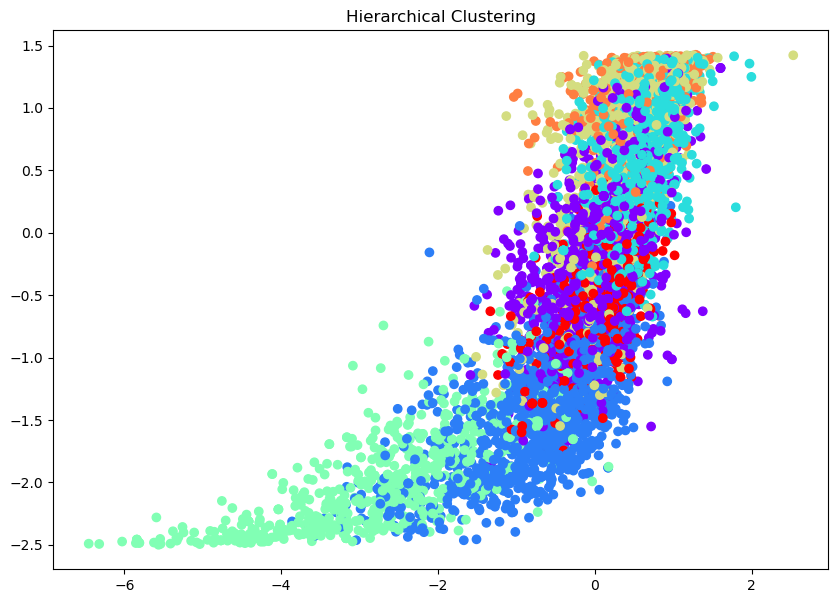

In [86]:
# Perform hierarchical clustering
# Because we know the number of genres is 7, we can set the number of clusters to 7
hclust = AgglomerativeClustering(n_clusters=7, affinity='euclidean', linkage='ward')
hclust_labels = hclust.fit(clustering_sampled_df).labels_

plt.figure(figsize=(10, 7))
plt.scatter(clustering_sampled_df.iloc[:, 0], clustering_sampled_df.iloc[:, 1], c=hclust_labels, cmap='rainbow')
plt.title('Hierarchical Clustering')
plt.show()


c:\Users\hbken\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



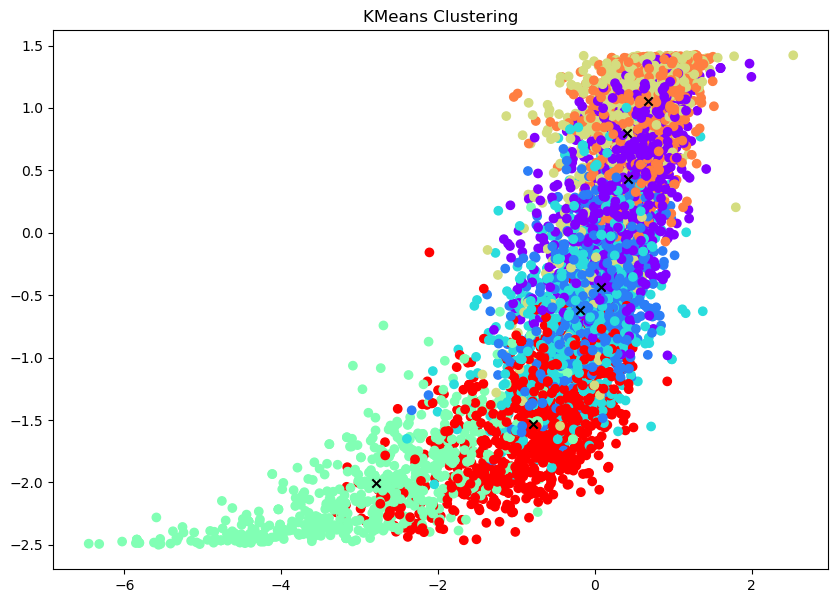

In [87]:
# Perform KMeans clustering
kmeans = KMeans(n_clusters=7)
y_kmeans = kmeans.fit_predict(clustering_sampled_df)

centroids = kmeans.cluster_centers_

plt.figure(figsize=(10, 7))
plt.scatter(clustering_sampled_df.iloc[:, 0], clustering_sampled_df.iloc[:, 1], c=y_kmeans, cmap='rainbow')
plt.scatter(centroids[:, 0], centroids[:, 1], c='black', marker='x')
plt.title('KMeans Clustering')
plt.show()

In [88]:
# The following code is to examine a portion of the grouping of the data
# It generates a table for each cluster and the count of each genre in that cluster

cluster_table_kmeans = pd.DataFrame({"cluster": y_kmeans, "genre": clustering_sampled_df.index}).groupby("cluster")["genre"].value_counts().unstack().fillna(0)
cluster_table_kmeans

genre,acoustic,alternative,blues,children,classical,club,death-metal
cluster,,,,,,,
0,154.0,135.0,276.0,285.0,4.0,176.0,27.0
1,197.0,122.0,155.0,67.0,17.0,146.0,17.0
2,109.0,12.0,277.0,390.0,86.0,34.0,0.0
3,27.0,0.0,4.0,42.0,565.0,16.0,0.0
4,4.0,3.0,15.0,7.0,4.0,372.0,261.0
5,57.0,110.0,85.0,22.0,4.0,194.0,583.0
6,443.0,24.0,122.0,153.0,153.0,48.0,0.0


In [89]:
# Visualize the proportion of each genre in each cluster
prop_cluster_table_kmeans = cluster_table_kmeans.div(cluster_table_kmeans.sum(axis=1), axis=0)
prop_cluster_table_kmeans

genre,acoustic,alternative,blues,children,classical,club,death-metal
cluster,,,,,,,
0,0.145695,0.127720,0.261116,0.269631,0.003784,0.166509,0.025544
1,0.273232,0.169209,0.214979,0.092926,0.023578,0.202497,0.023578
2,0.120044,0.013216,0.305066,0.429515,0.094714,0.037445,0.000000
3,0.041284,0.000000,0.006116,0.064220,0.863914,0.024465,0.000000
4,0.006006,0.004505,0.022523,0.010511,0.006006,0.558559,0.391892
5,0.054028,0.104265,0.080569,0.020853,0.003791,0.183886,0.552607
6,0.469777,0.025451,0.129374,0.162248,0.162248,0.050901,0.000000


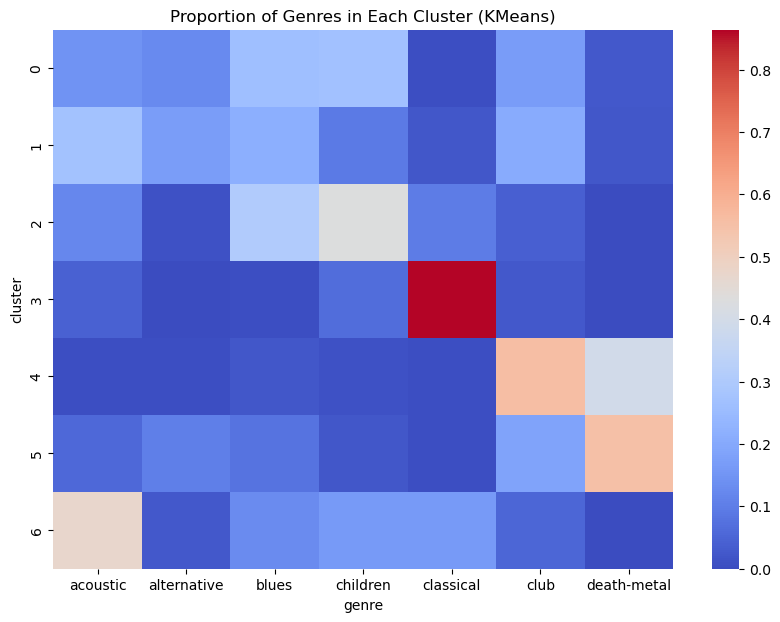

In [90]:
# We can also visualize the proportion of each genre in each cluster using a heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(prop_cluster_table_kmeans, cmap='coolwarm')
plt.title('Proportion of Genres in Each Cluster (KMeans)')
plt.show()

In [91]:
# Now we can work backwards to see if we can identify the genres from the clusters
# We can do this by finding the genre that is most common in each cluster
genre_cluster_kmeans = prop_cluster_table_kmeans.idxmax(axis=1)
genre_cluster_kmeans


cluster
0       children
1       acoustic
2       children
3      classical
4           club
5    death-metal
6       acoustic
dtype: object

In [92]:
# Lets now do the same for hierarchical clustering
cluster_table_hclust = pd.DataFrame({"cluster": hclust_labels, "genre": clustering_sampled_df.index}).groupby("cluster")["genre"].value_counts().unstack().fillna(0)
cluster_table_hclust


genre,acoustic,alternative,blues,children,classical,club,death-metal
cluster,,,,,,,
0,145.0,73.0,374.0,473.0,46.0,80.0,2.0
1,509.0,45.0,216.0,280.0,201.0,65.0,2.0
2,162.0,159.0,211.0,119.0,12.0,232.0,132.0
3,29.0,0.0,7.0,47.0,555.0,17.0,0.0
4,10.0,8.0,27.0,18.0,11.0,403.0,259.0
5,18.0,57.0,24.0,6.0,1.0,106.0,485.0
6,118.0,64.0,75.0,23.0,7.0,83.0,8.0


In [93]:
prop_cluster_table_hclust = cluster_table_hclust.div(cluster_table_hclust.sum(axis=1), axis=0)
prop_cluster_table_hclust

genre,acoustic,alternative,blues,children,classical,club,death-metal
cluster,,,,,,,
0,0.121542,0.061190,0.313495,0.396479,0.038558,0.067058,0.001676
1,0.386191,0.034143,0.163885,0.212443,0.152504,0.049317,0.001517
2,0.157741,0.154820,0.205453,0.115871,0.011685,0.225901,0.128530
3,0.044275,0.000000,0.010687,0.071756,0.847328,0.025954,0.000000
4,0.013587,0.010870,0.036685,0.024457,0.014946,0.547554,0.351902
5,0.025825,0.081779,0.034433,0.008608,0.001435,0.152080,0.695839
6,0.312169,0.169312,0.198413,0.060847,0.018519,0.219577,0.021164


In [94]:
genre_cluster_hclust = prop_cluster_table_hclust.idxmax(axis=1)
genre_cluster_hclust

cluster
0       children
1       acoustic
2           club
3      classical
4           club
5    death-metal
6       acoustic
dtype: object

In [95]:
print(d)

{'acoustic': 1, 'children': 2, 'alternative': 3, 'classical': 4, 'death-metal': 5, 'club': 6, 'blues': 7}


In [96]:
# Use accuracy and error rate to evaluate the clustering
# We will also look at the silhouette scores for each clustering method
### IMPORTANT NOTE: The labels assigned by the clustering algorithms are arbitrary, so we might need to flip them to match the true labels ###
### This is on a case by case basis, so make sure to check the labels assigned by the clustering algorithms before using the error/accuracy metrics in your analysis ###

# Sample mapping (may change run to run!)
# Maps cluster labels to the set of mapped true labels
d_hclust = {0: 2, 1: 1, 2: 6, 3: 4, 4: 6, 5:5, 6:1}
d_kmeans = {0: 4, 1: 5, 2: 2, 3: 1, 4: 6, 5: 1, 6: 7}

hclust_labels = pd.Series(hclust_labels).map(d_hclust)
y_kmeans = pd.Series(y_kmeans).map(d_kmeans)

# For KMeans
accuracy_kmeans = metrics.accuracy_score(true_labels, y_kmeans)
error_kmeans = 1 - accuracy_kmeans
silhouette_score_kmeans = silhouette_score(clustering_sampled_df, y_kmeans)

# For Hierarchical Clustering
accuracy_hclust = metrics.accuracy_score(true_labels, hclust_labels)
error_hclust = 1 - accuracy_hclust
silhouette_score_hclust = silhouette_score(clustering_sampled_df, hclust_labels)

# Print the results
print("KMeans Clustering")
print("Accuracy:", accuracy_kmeans)
print("Error Rate:", error_kmeans)
print("Silhouette Score:", silhouette_score_kmeans)
print("\n")

print("Hierarchical Clustering")
print("Accuracy:", accuracy_hclust)
print("Error Rate:", error_hclust)
print("Silhouette Score:", silhouette_score_hclust)
print("\n")

KMeans Clustering
Accuracy: 0.16472351765489673
Error Rate: 0.8352764823451033
Silhouette Score: 0.15763220978028497


Hierarchical Clustering
Accuracy: 0.46219187208527646
Error Rate: 0.5378081279147235
Silhouette Score: 0.20589688666448774




Our clustering was not very effective for our selected genres, as the clusters did not correspond to the genre of the song. This could be due to the fact that the genres we selected are not very distinct from each other in terms of the music features, or that the clustering algorithm we used was not able to effectively separate the genres. Let's try with a smaller set of distinct genres to test our methods.

In [97]:
clustering_data = pca_scaled_data[['loudness', 'energy', 'acousticness','instrumentalness', 'valence']]
genre = ["cantopop", "chicago-house"]

clustering_sampled_df = clustering_data.loc[genre]

true_labels = clustering_sampled_df.index.map({"cantopop": 0, "chicago-house": 1})

c:\Users\hbken\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

c:\Users\hbken\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=8.



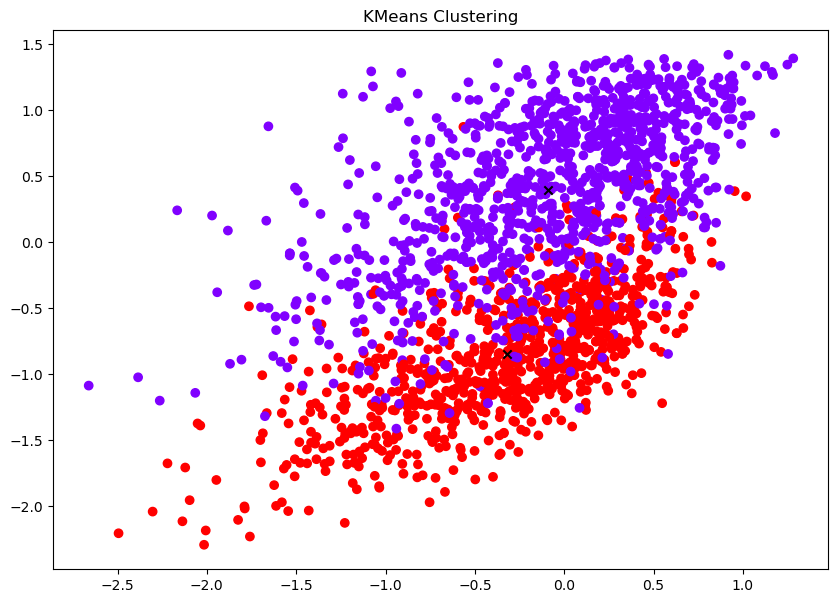

In [98]:
# KMeans Clustering
kmeans = KMeans(n_clusters=2)
ykmeans = kmeans.fit_predict(clustering_sampled_df)

centroids = kmeans.cluster_centers_

plt.figure(figsize=(10, 7))
plt.scatter(clustering_sampled_df.iloc[:, 0], clustering_sampled_df.iloc[:, 1], c=ykmeans, cmap='rainbow')
plt.scatter(centroids[:, 0], centroids[:, 1], c='black', marker='x')
plt.title('KMeans Clustering')
plt.show()

c:\Users\hbken\anaconda3\Lib\site-packages\sklearn\cluster\_agglomerative.py:983: FutureWarning:

Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead



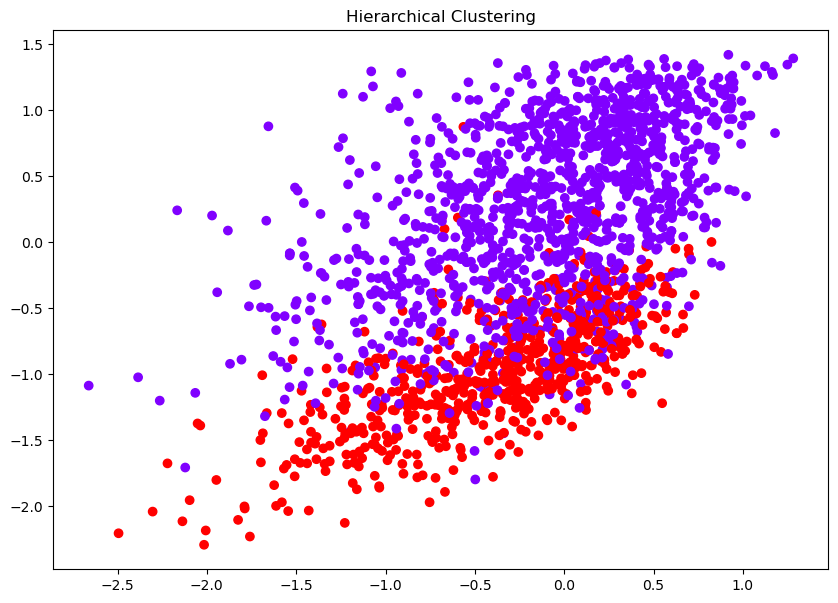

In [99]:
# Hierarchical Clustering
hclust = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
hclust_labels = hclust.fit(clustering_sampled_df).labels_

plt.figure(figsize=(10, 7))
plt.scatter(clustering_sampled_df.iloc[:, 0], clustering_sampled_df.iloc[:, 1], c=hclust_labels, cmap='rainbow')
plt.title('Hierarchical Clustering')
plt.show()

By visuals alone, the clusters seem to be much more well defined than before, however, visuals alone are not indicative of effectiveness, as clusters often exist in high-dimensional space.

In [100]:
cluster_table_kmeans = pd.DataFrame({"cluster": ykmeans, "genre": clustering_sampled_df.index}).groupby("cluster")["genre"].value_counts().unstack().fillna(0)
cluster_table_kmeans

genre,cantopop,chicago-house
cluster,,
0,134,974
1,864,24


In [101]:
prop_cluster_table_kmeans = cluster_table_kmeans.div(cluster_table_kmeans.sum(axis=1), axis=0)
prop_cluster_table_kmeans

genre,cantopop,chicago-house
cluster,,
0,0.120939,0.879061
1,0.972973,0.027027


In [102]:
cluster_table_hclust = pd.DataFrame({"cluster": hclust_labels, "genre": clustering_sampled_df.index}).groupby("cluster")["genre"].value_counts().unstack().fillna(0)
cluster_table_hclust

genre,cantopop,chicago-house
cluster,,
0,322,997
1,676,1


In [103]:
prop_cluster_table_hclust = cluster_table_hclust.div(cluster_table_hclust.sum(axis=1), axis=0)
prop_cluster_table_hclust

genre,cantopop,chicago-house
cluster,,
0,0.244124,0.755876
1,0.998523,0.001477


In [104]:
# As before, use accuracy and error rate to evaluate the clustering
### IMPORTANT NOTE: The labels assigned by the clustering algorithms are arbitrary, so we might need to flip them to match the true labels ###
### This is on a case by case basis, so make sure to check the labels assigned by the clustering algorithms before using the error/accuracy metrics in your analysis ###

# For KMeans
ykmeans = [0 if x == 1 else 1 for x in ykmeans] # flip labels to match order of true labels
accuracy_kmeans = metrics.accuracy_score(true_labels, ykmeans)
error_kmeans = 1 - accuracy_kmeans
silhouette_score_kmeans = silhouette_score(clustering_sampled_df, ykmeans)

# For Hierarchical Clustering
hclust_labels = [0 if x == 1 else 1 for x in hclust_labels] # flip labels to match order of true labels
accuracy_hclust = metrics.accuracy_score(true_labels, hclust_labels)
error_hclust = 1 - accuracy_hclust
silhouette_score_hclust = silhouette_score(clustering_sampled_df, hclust_labels)

# Print the results
print("KMeans Clustering")
print("Accuracy:", accuracy_kmeans)
print("Error Rate:", error_kmeans)
print("Silhouette Score:", silhouette_score_kmeans)
print("\n")

print("Hierarchical Clustering")
print("Accuracy:", accuracy_hclust)
print("Error Rate:", error_hclust)
print("Silhouette Score:", silhouette_score_hclust)
print("\n")

KMeans Clustering
Accuracy: 0.9208416833667334
Error Rate: 0.07915831663326656
Silhouette Score: 0.36934642389667216


Hierarchical Clustering
Accuracy: 0.8381763527054108
Error Rate: 0.1618236472945892
Silhouette Score: 0.34069147956129936




The accuracy of both clustering models is much higher for the smaller set of genres than for the larger set of genres. This suggests that the clustering models are more effective at separating the smaller set of genres than the larger set of genres. This could be due to the fact that the smaller set of genres are more distinct from each other in terms of the music features, or that the clustering algorithm we used was more effective at separating the smaller set of genres. Feel free to modify the code and test out different genres to see how the clustering models perform!

# 7. Neural Networks

In [105]:
nn_data = pd.read_excel('Data/clean_data.xlsx')

In [106]:
# List of genres to subset
genres = ["chicago-house", "cantopop"]

# Subset the data to only include the specified genres
nn_data = nn_data.loc[nn_data['track_genre'].isin(genres)]

In [107]:
#remove categoical variables
data_clean = nn_data[["loudness", "energy", "acousticness", "instrumentalness", "valence", "danceability"]]
data_clean.head()

,loudness,energy,acousticness,instrumentalness,valence,danceability
11053,-13.070,0.505,0.753,0.199000,0.570,0.576
11054,-14.684,0.228,0.834,0.000805,0.161,0.577
11055,-15.395,0.479,0.732,0.059800,0.301,0.641
11056,-15.309,0.210,0.769,0.000477,0.268,0.613
11057,-10.980,0.370,0.825,0.000005,0.465,0.646


In [108]:
number_genre = nn_data['track_genre'].nunique()
number_genre

2

In [109]:
# Convert genre to integers

# Create a mapping dictionary
unique_classes = list(set(nn_data['track_genre']))
class_to_int = {cls: idx + 1 for idx, cls in enumerate(unique_classes)}

# Apply the mapping
encoded = [class_to_int[cls] for cls in nn_data['track_genre']]

In [110]:
#Convert X, Y to arrays
y = np.array(encoded)
X = data_clean

In [111]:
# Initialize MinMaxScaler
scaler = MinMaxScaler()

# Normalize the DataFrame
X_norm = scaler.fit_transform(X)
X_norm = np.array(X_norm)

In [112]:
# Check dimensions
print(y.shape)
print(X_norm.shape)

(1996,)
(1996, 6)


In [113]:
from sklearn.model_selection import train_test_split


X_temp, X_test, y_temp, y_test = train_test_split(
    X_norm, y, test_size=0.2, random_state=123, stratify=y)

X_train, X_valid, y_train, y_valid = train_test_split(
    X_temp, y_temp, test_size=0.07, random_state=123, stratify=y_temp)

The next step in this code is to implement a neural network model to classify the subset of genres from our dataset. We will use the same binary variable as earlier in the code which is the genre of the song, specifically the subset of the data that contains the genres 'cantopop' and 'chicago-house'. Most of the following code is modified from our M148 Labs, which were provided to us by the course staff.

In [114]:
##########################
### MODEL
##########################

def sigmoid(z):
    return 1. / (1. + np.exp(-z))


def int_to_onehot(y, num_labels):

    ary = np.zeros((y.shape[0], num_labels))
    for i, val in enumerate(y):
        ary[i, val-1] = 1

    return ary


class NeuralNetMLP:

    def __init__(self, num_features, num_hidden, num_classes, random_seed=123):
        super().__init__()

        self.num_classes = num_classes

        # hidden
        rng = np.random.RandomState(random_seed)

        self.weight_h = rng.normal(
            loc=0.0, scale=0.1, size=(num_hidden, num_features))
        self.bias_h = np.zeros(num_hidden)

        # output
        self.weight_out = rng.normal(
            loc=0.0, scale=0.1, size=(num_classes, num_hidden))
        self.bias_out = np.zeros(num_classes)

    def forward(self, x):
        # Hidden layer
        # input dim: [n_examples, n_features] dot [n_hidden, n_features].T
        # output dim: [n_examples, n_hidden]
        z_h = np.dot(x, self.weight_h.T) + self.bias_h
        a_h = sigmoid(z_h)

        # Output layer
        # input dim: [n_examples, n_hidden] dot [n_classes, n_hidden].T
        # output dim: [n_examples, n_classes]
        z_out = np.dot(a_h, self.weight_out.T) + self.bias_out
        a_out = sigmoid(z_out)
        return a_h, a_out

    def backward(self, x, a_h, a_out, y):

        #########################
        ### Output layer weights
        #########################

        # onehot encoding
        y_onehot = int_to_onehot(y, self.num_classes)

        # Part 1: dLoss/dOutWeights
        ## = dLoss/dOutAct * dOutAct/dOutNet * dOutNet/dOutWeight
        ## where DeltaOut = dLoss/dOutAct * dOutAct/dOutNet
        ## for convenient re-use

        # input/output dim: [n_examples, n_classes]
        d_loss__d_a_out = 2.*(a_out - y_onehot) / y.shape[0]

        # input/output dim: [n_examples, n_classes]
        d_a_out__d_z_out = a_out * (1. - a_out) # sigmoid derivative

        # output dim: [n_examples, n_classes]
        delta_out = d_loss__d_a_out * d_a_out__d_z_out # "delta (rule) placeholder"

        # gradient for output weights

        # [n_examples, n_hidden]
        d_z_out__dw_out = a_h

        # input dim: [n_classes, n_examples] dot [n_examples, n_hidden]
        # output dim: [n_classes, n_hidden]
        d_loss__dw_out = np.dot(delta_out.T, d_z_out__dw_out)
        d_loss__db_out = np.sum(delta_out, axis=0)


        #################################
        # Part 2: dLoss/dHiddenWeights
        ## = DeltaOut * dOutNet/dHiddenAct * dHiddenAct/dHiddenNet * dHiddenNet/dWeight

        # [n_classes, n_hidden]
        d_z_out__a_h = self.weight_out

        # output dim: [n_examples, n_hidden]
        d_loss__a_h = np.dot(delta_out, d_z_out__a_h)

        # [n_examples, n_hidden]
        d_a_h__d_z_h = a_h * (1. - a_h) # sigmoid derivative

        # [n_examples, n_features]
        d_z_h__d_w_h = x

        # output dim: [n_hidden, n_features]
        d_loss__d_w_h = np.dot((d_loss__a_h * d_a_h__d_z_h).T, d_z_h__d_w_h)
        d_loss__d_b_h = np.sum((d_loss__a_h * d_a_h__d_z_h), axis=0)

        return (d_loss__dw_out, d_loss__db_out,
                d_loss__d_w_h, d_loss__d_b_h)

In [115]:
model = NeuralNetMLP(num_features=6,
                     num_hidden=50,
                     num_classes=number_genre)

Coding the neural network training loop

In [116]:
num_epochs =50
minibatch_size = 100


def minibatch_generator(X, y, minibatch_size):
    indices = np.arange(X.shape[0])
    np.random.shuffle(indices)

    for start_idx in range(0, indices.shape[0] - minibatch_size
                           + 1, minibatch_size):
        batch_idx = indices[start_idx:start_idx + minibatch_size]

        yield X[batch_idx], y[batch_idx]


# iterate over training epochs
for i in range(num_epochs):

    # iterate over minibatches
    minibatch_gen = minibatch_generator(
        X_train, y_train, minibatch_size)

    for X_train_mini, y_train_mini in minibatch_gen:

        break

    break

print(X_train_mini.shape)
print(y_train_mini.shape)

(100, 6)
(100,)


The next step is to defining a function to compute the loss and accuracy. We will use MSE as our loss function.

In [117]:
def mse_loss(targets, probas, num_labels=number_genre):
    onehot_targets = int_to_onehot(targets, num_labels=num_labels)
    return np.mean((onehot_targets - probas)**2)


def accuracy(targets, predicted_labels):
    return np.mean(predicted_labels == targets)


_, probas = model.forward(X_valid)
mse = mse_loss(y_valid, probas)

predicted_labels = np.argmax(probas, axis=1)
acc = accuracy(y_valid, predicted_labels)

print(f'Initial validation MSE: {mse:.1f}')
print(f'Initial validation accuracy: {acc*100:.1f}%')

Initial validation MSE: 0.3
Initial validation accuracy: 0.0%


In [118]:
def compute_mse_and_acc(nnet, X, y, num_labels=number_genre, minibatch_size=100):
    mse, correct_pred, num_examples = 0., 0, 0
    minibatch_gen = minibatch_generator(X, y, minibatch_size)

    for i, (features, targets) in enumerate(minibatch_gen):

        _, probas = nnet.forward(features)
        predicted_labels = np.argmax(probas, axis=1)

        onehot_targets = int_to_onehot(targets, num_labels=num_labels)
        loss = np.mean((onehot_targets - probas)**2)
        correct_pred += (predicted_labels == targets).sum()

        num_examples += targets.shape[0]
        mse += loss

    mse = mse/(i+1)
    acc = correct_pred/num_examples
    return mse, acc

In [119]:
mse, acc = compute_mse_and_acc(model, X_valid, y_valid)
print(f'Initial valid MSE: {mse:.1f}')
print(f'Initial valid accuracy: {acc*100:.1f}%')

Initial valid MSE: 0.3
Initial valid accuracy: 0.0%


Next, we will determine the optimal learning rate for our neural network. To find the best learning rate, we will increment the learning rate by 10/50 from 10e-5 and plot it against the loss. The optimal learning rate will be half of the maximum learning rate where loss is the lowest.

In [120]:
def train(model, X_train, y_train, X_valid, y_valid, num_epochs, initial_learning_rate=10e-5):
    epoch_loss = []
    epoch_train_acc = []
    epoch_valid_acc = []
    lr = []

    # Initialize the learning rate
    learning_rate = initial_learning_rate

    for e in range(num_epochs):

        # Increment learning rate by 10/50 every epoch
        learning_rate += 10 / 50
        lr.append(learning_rate)

        # iterate over minibatches
        minibatch_gen = minibatch_generator(X_train, y_train, minibatch_size)

        for X_train_mini, y_train_mini in minibatch_gen:

            #### Compute outputs ####
            a_h, a_out = model.forward(X_train_mini)

            #### Compute gradients ####
            d_loss__d_w_out, d_loss__d_b_out, d_loss__d_w_h, d_loss__d_b_h = \
                model.backward(X_train_mini, a_h, a_out, y_train_mini)

            lambda_reg  = 0.01 # regularization strength
            #### Update weights w/ l2 regularization####
            model.weight_h -= learning_rate * (d_loss__d_w_h + lambda_reg * model.weight_h)
            model.bias_h -= learning_rate * d_loss__d_b_h  # No regularization on biases (usually)
            model.weight_out -= learning_rate * (d_loss__d_w_out + lambda_reg * model.weight_out)
            model.bias_out -= learning_rate * d_loss__d_b_out  # No regularization on biases (usually)

        #### Epoch Logging ####
        train_mse, train_acc = compute_mse_and_acc(model, X_train, y_train)
        valid_mse, valid_acc = compute_mse_and_acc(model, X_valid, y_valid)
        train_acc, valid_acc = train_acc * 100, valid_acc * 100
        epoch_train_acc.append(train_acc)
        epoch_valid_acc.append(valid_acc)
        epoch_loss.append(train_mse)
        print(f'Epoch: {e+1:03d}/{num_epochs:03d} '
              f'| Learning Rate: {learning_rate:.4f} '
              f'| Train MSE: {train_mse:.2f} '
              f'| Train Acc: {train_acc:.2f}% '
              f'| Valid Acc: {valid_acc:.2f}%')

    return epoch_loss, epoch_train_acc, epoch_valid_acc, lr

In [121]:
np.random.seed(123) # for the training set shuffling

epoch_loss, epoch_train_acc, epoch_valid_acc, lr = train(
    model, X_train, y_train, X_valid, y_valid,
    num_epochs=50, initial_learning_rate=10e-5)

Epoch: 001/050 | Learning Rate: 0.2001 | Train MSE: 0.25 | Train Acc: 0.00% | Valid Acc: 0.00%
Epoch: 002/050 | Learning Rate: 0.4001 | Train MSE: 0.25 | Train Acc: 0.00% | Valid Acc: 0.00%
Epoch: 003/050 | Learning Rate: 0.6001 | Train MSE: 0.25 | Train Acc: 0.00% | Valid Acc: 0.00%
Epoch: 004/050 | Learning Rate: 0.8001 | Train MSE: 0.25 | Train Acc: 49.86% | Valid Acc: 50.00%
Epoch: 005/050 | Learning Rate: 1.0001 | Train MSE: 0.23 | Train Acc: 0.00% | Valid Acc: 0.00%
Epoch: 006/050 | Learning Rate: 1.2001 | Train MSE: 0.22 | Train Acc: 0.00% | Valid Acc: 0.00%
Epoch: 007/050 | Learning Rate: 1.4001 | Train MSE: 0.21 | Train Acc: 49.50% | Valid Acc: 49.00%
Epoch: 008/050 | Learning Rate: 1.6001 | Train MSE: 0.26 | Train Acc: 50.43% | Valid Acc: 47.00%
Epoch: 009/050 | Learning Rate: 1.8001 | Train MSE: 0.24 | Train Acc: 48.93% | Valid Acc: 50.00%
Epoch: 010/050 | Learning Rate: 2.0001 | Train MSE: 0.10 | Train Acc: 11.07% | Valid Acc: 16.00%
Epoch: 011/050 | Learning Rate: 2.2001 |

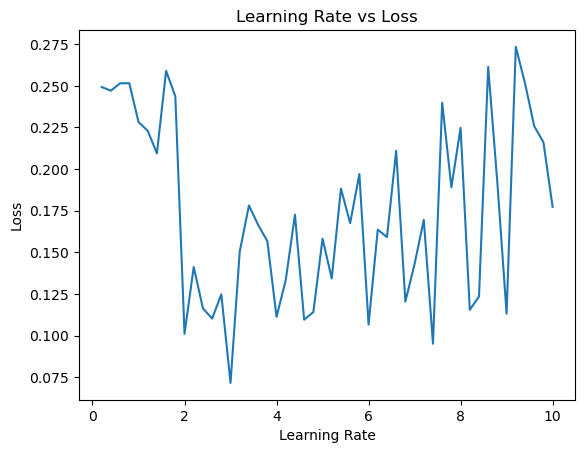

In [122]:
plt.figure()
plt.plot (lr,epoch_loss)
plt.xlabel('Learning Rate')
plt.ylabel('Loss')
plt.title('Learning Rate vs Loss')
plt.show()

In [123]:
min_loss = min(epoch_loss)
min_loss_index = epoch_loss.index(min_loss)
min_lr = lr[min_loss_index]/2
# optimal learning rate is 1/2 max. learning rate to prevent overfitting
print(min_lr)

1.5000500000000003


In [124]:
def train(model, X_train, y_train, X_valid, y_valid, num_epochs,
          learning_rate=min_lr):

    epoch_loss_train = []
    epoch_loss_valid = []
    epoch_train_acc = []
    epoch_valid_acc = []

    for e in range(num_epochs):

        # iterate over minibatches
        minibatch_gen = minibatch_generator(
            X_train, y_train, minibatch_size)

        for X_train_mini, y_train_mini in minibatch_gen:

            #### Compute outputs ####
            a_h, a_out = model.forward(X_train_mini)

            #### Compute gradients ####
            d_loss__d_w_out, d_loss__d_b_out, d_loss__d_w_h, d_loss__d_b_h = \
                model.backward(X_train_mini, a_h, a_out, y_train_mini)

            #### Update weights ####
            model.weight_h -= learning_rate * d_loss__d_w_h
            model.bias_h -= learning_rate * d_loss__d_b_h
            model.weight_out -= learning_rate * d_loss__d_w_out
            model.bias_out -= learning_rate * d_loss__d_b_out

        #### Epoch Logging ####
        train_mse, train_acc = compute_mse_and_acc(model, X_train, y_train)
        valid_mse, valid_acc = compute_mse_and_acc(model, X_valid, y_valid)
        train_acc, valid_acc = train_acc*100, valid_acc*100
        epoch_train_acc.append(train_acc)
        epoch_valid_acc.append(valid_acc)
        epoch_loss_train.append(train_mse)
        epoch_loss_valid.append(valid_mse)
        print(f'Epoch: {e+1:03d}/{num_epochs:03d} '
              f'| Train MSE: {train_mse:.2f} '
              f'| Train Acc: {train_acc:.2f}% '
              f'| Valid Acc: {valid_acc:.2f}%'
              f'| Valid MSE: {valid_mse:.2f}')

    return epoch_loss_train, epoch_train_acc, epoch_valid_acc, epoch_loss_valid

In [125]:
np.random.seed(123) # for the training set shuffling

epoch_loss_train, epoch_train_acc, epoch_valid_acc, epoch_loss_valid = train(
    model, X_train, y_train, X_valid, y_valid,
    num_epochs=50, learning_rate=min_lr)

Epoch: 001/050 | Train MSE: 0.07 | Train Acc: 3.07% | Valid Acc: 5.00%| Valid MSE: 0.08
Epoch: 002/050 | Train MSE: 0.06 | Train Acc: 2.14% | Valid Acc: 2.00%| Valid MSE: 0.06
Epoch: 003/050 | Train MSE: 0.05 | Train Acc: 3.29% | Valid Acc: 5.00%| Valid MSE: 0.06
Epoch: 004/050 | Train MSE: 0.04 | Train Acc: 3.36% | Valid Acc: 5.00%| Valid MSE: 0.05
Epoch: 005/050 | Train MSE: 0.04 | Train Acc: 3.07% | Valid Acc: 5.00%| Valid MSE: 0.05
Epoch: 006/050 | Train MSE: 0.04 | Train Acc: 2.86% | Valid Acc: 6.00%| Valid MSE: 0.05
Epoch: 007/050 | Train MSE: 0.04 | Train Acc: 2.36% | Valid Acc: 5.00%| Valid MSE: 0.05
Epoch: 008/050 | Train MSE: 0.03 | Train Acc: 2.36% | Valid Acc: 4.00%| Valid MSE: 0.04
Epoch: 009/050 | Train MSE: 0.03 | Train Acc: 2.07% | Valid Acc: 3.00%| Valid MSE: 0.03
Epoch: 010/050 | Train MSE: 0.03 | Train Acc: 1.29% | Valid Acc: 2.00%| Valid MSE: 0.04
Epoch: 011/050 | Train MSE: 0.03 | Train Acc: 1.50% | Valid Acc: 3.00%| Valid MSE: 0.04
Epoch: 012/050 | Train MSE: 0.03

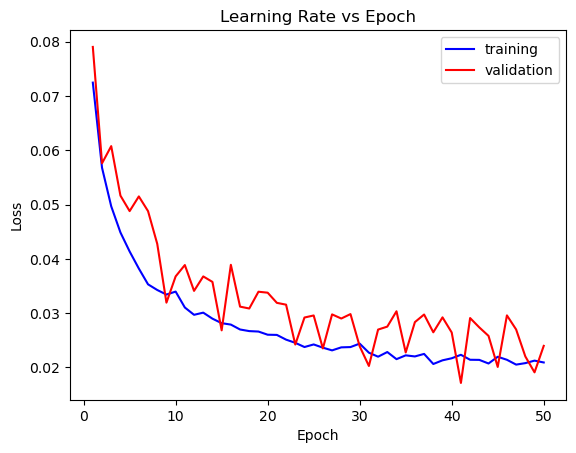

In [126]:
plt.figure()
y = range(1, len(epoch_loss) + 1)
plt.plot (y, epoch_loss_train, color = 'blue', label = 'training')
plt.plot (y, epoch_loss_valid, color = 'red', label = 'validation')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Learning Rate vs Epoch')
plt.legend()
plt.show()

# Loss for both training and validation are lowest at epoch is 50, thus 50 is a good number of iterations